Lesson 10 - Applied Regression Modeling - Model Selection and Prediction Part 2 (Cross Validation, Bias-Variance Tradeoff, Shrinkage Methods/Ridge/LASSO/Adaptive LASSO/ElasticNet/Regularization)) 

Much of this last class was taken with reference to these two books. 

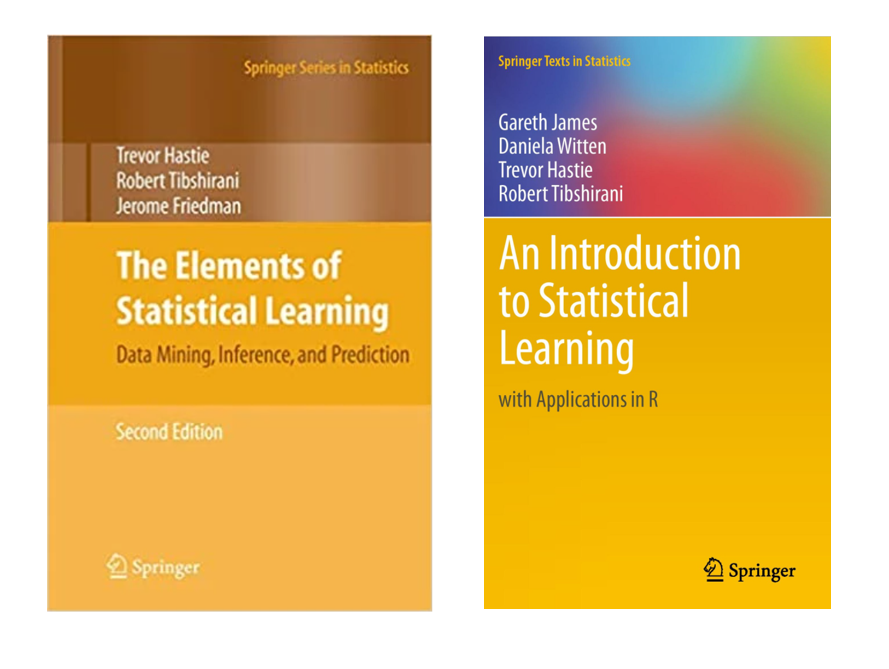



# Copy of the book:
https://www.usna.edu/Users/cs/taylor/courses/si486l/resources/JWHT.pdf

# Trevor Hastie and Robert Tibshirani are both Stanford statisticians and professors. They teach this course on EdX, and you can take it here:

https://www.edx.org/course/statistical-learning


# Definitions

In [1]:
def num_columns(series):
    """
    returns the number of columns in a series or dataframe
    """
    
    try: return series.shape[1]
    except: return 1
    
def make_number(series):
    
    """ this function is used to apply to a column of data to convrt it to a float value.
    It converts the value to a 0 if it is a string that cannot be converted."""
    
    try: return float(series)
    except: return 0

def clean_data(series, make_all_numbers):
    
    """ applies cleaning algorithms to series.     
        make_all_numbers == True makes all values a numerical value. If not a number it converts it to a zero.
    """
    
    if make_all_numbers: 
        series = series.map(make_number) if num_columns(y) == 1 else series.applymap(make_number)
    
    return series

def check_size(X,y):
    if (len(X.columns) < 1)and((len(y.columns)>1)):
        print("This won't work. You can't have more than one column of dependent variables, and you need to include independent variable(s) 'X' in your model.")
    elif(len(X.columns) < 1):
        print("This won't work. You need to include at least one column of values for your independent variable.")
    elif(len(y.columns) < 1):
        print("This won't work. You need one column of values for your independent variable.")        
    else:
        pass

def ols_model_fit(X,y, add_intercept=True):
    
    X = sm.add_constant(X) if add_intercept==True else X
    fitted_ols_model = sm.OLS(y, X).fit()
    
    return fitted_ols_model

def get_vifs(X, add_intercept):
    
    X = sm.add_constant(X) if add_intercept==True else X

    if ((X.columns[0] == 'const')and(len(X.columns)==2)):
        vifs = [np.nan, np.nan]
    
    elif (len(X.columns)==1):
        vifs = [np.nan]
        
    elif X.columns[0] == 'const':
        data = X.drop(columns = ['const']).copy()
        vifs = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]
        vifs = [np.nan]+vifs
    else:
        data = X.copy()
        vifs = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]
    
    vifs = pd.Series(vifs, index = X.columns.to_list(), name = 'VIF')
    
    return vifs

def get_summary_of_fit(X,y,fitted_ols_model, add_intercept):
    
    rsquared = fitted_ols_model.rsquared
    rsquared_adj = fitted_ols_model.rsquared_adj
    root_mean_square_error = (
        (mean_squared_error(y,fitted_ols_model.predict(sm.add_constant(X))))*0.5 if add_intercept==True 
        else (mean_squared_error(y,fitted_ols_model.predict(X)))*0.5
    )
    mean_of_response = round(y.mean(),5)
    num_observations = fitted_ols_model.nobs
    
    bic = fitted_ols_model.bic
    aic = fitted_ols_model.aic

    summary_of_fit_dict = {
        'RSquare':rsquared,
        'RSquare Adj':rsquared_adj,
        'Root Mean Square Error':root_mean_square_error,
        'AIC':aic,    
        'BIC':bic,
        'Mean of Response':mean_of_response,
        'Observations (or Sum Wgts)':num_observations
    }

    summary_of_fit = pd.DataFrame(
        {
        ' ':list(summary_of_fit_dict.keys()),
        '':list(summary_of_fit_dict.values())
        }
    )

    return summary_of_fit, summary_of_fit_dict

def beautify_summary_of_fit(summary_of_fit):
    
    summary_of_fit[''] = round(summary_of_fit[''],6)
    summary_of_fit= summary_of_fit.astype(str)
    
    summary_of_fit[''].iloc[-1] = summary_of_fit[''].iloc[-1].replace('.0','')

    s = summary_of_fit.style.set_properties(**{'text-align': 'left'})
    s = s.set_caption('Summary of Fit').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    
    return s

def get_anova(fitted_ols_model):
    
    model_mse = round(fitted_ols_model.mse_model,3)
    resid_mse = round(fitted_ols_model.mse_resid,3)
    total_mse = round(fitted_ols_model.mse_total,3)

    model_df = int(fitted_ols_model.df_model)
    resid_df = int(fitted_ols_model.df_resid)
    total_df = int(model_df+resid_df)

    model_ss = round(model_mse*model_df,3)
    error_ss = round(resid_mse*resid_df,3)
    total_ss = round(total_mse*total_df,3)

    f_ratio = round(fitted_ols_model.fvalue,4)
    prob_f = round(fitted_ols_model.f_pvalue,4)

    source = ['Model','Error','C.Total']
    df = [model_df, resid_df, total_df]
    ss = [model_ss, error_ss, total_ss]
    ms = [model_ss, error_ss, '']
    fr = [f_ratio, 'Prob > F', prob_f]

    analysis_of_variance_dict = {
        'Source':source,
        'Deg of Freedom':df,
        'Sum of Squares':ss,
        'Mean Square':ms,
        'F Ratio':fr
    }
    
    analysis_of_variance = pd.DataFrame(analysis_of_variance_dict)
    
    return analysis_of_variance, analysis_of_variance_dict

def reformat_p_values(pvalue):

    if float(pvalue) < 0.0001:
        new_pvalue = '<.0001*'
        
    elif ((float(pvalue) >= 0.0001)and(float(pvalue) < 0.05)):
        pvalue = round(pvalue,4)
        new_pvalue = '{}*'.format(pvalue)
        
    else: 
        pvalue = round(pvalue,4)
        new_pvalue = str(pvalue)

    return new_pvalue

def color_p_values(val):
    
    if '*' in val:
        val = float(val.replace('<','').replace('*',''))
        if val < 0.01:
            color = 'darkorange'
        elif ((val >= 0.01)and(val < 0.05)):
            color = 'red'
        else:
            color = 'black'
        return 'color: %s' % color
    
    else:
        return 'color: black'  
def beautify_analysis_of_variance(analysis_of_variance):
    
    def reformat_p_values(pvalue):

        if float(pvalue) < 0.0001:
            new_pvalue = '<.0001*'

        elif ((float(pvalue) >= 0.0001)and(float(pvalue) < 0.05)):
            pvalue = round(pvalue,4)
            new_pvalue = '{}*'.format(pvalue)

        else: 
            pvalue = round(pvalue,4)
            new_pvalue = str(pvalue)

        return new_pvalue
    
    def color_p_values(val):
    
        if '*' in val:
            val = float(val.replace('<','').replace('*',''))
            if val < 0.01:
                color = 'darkorange'
            elif ((val >= 0.01)and(val < 0.05)):
                color = 'red'
            else:
                color = 'black'
            return 'color: %s' % color

        else:
            return 'color: black'  
    
    
    def bold_f_val(val):
        if val == 'Prob > F':
            return 'font-weight: bold'
        else:
            return 'font-weight: normal'
    
    pvalue=analysis_of_variance.iloc[2,4]
    new_pvalue = reformat_p_values(pvalue)
    analysis_of_variance.iloc[2,4] = new_pvalue
    analysis_of_variance['Sum of Squares'] = analysis_of_variance['Sum of Squares'].astype(str)
    analysis_of_variance['Mean Square'] = analysis_of_variance['Mean Square'].astype(str)
    analysis_of_variance['F Ratio'] = analysis_of_variance['F Ratio'].astype(str)
    s = analysis_of_variance.style.set_properties(**{'text-align': 'left'})
    s = s.applymap(color_p_values, subset = ['F Ratio'])
    s = s.applymap(bold_f_val, subset = ['F Ratio'])
    s = s.set_caption('Analysis of Variance').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    
    return s

def get_parameter_estimates(X,fitted_ols_model, add_intercept):

    terms = fitted_ols_model.params.index.to_list()
    estimates = fitted_ols_model.params.to_list()
    standard_errors = fitted_ols_model.bse.to_list()
    t_ratios = fitted_ols_model.tvalues.to_list()
    p_values = fitted_ols_model.pvalues.to_list()
    lower_95 = fitted_ols_model.conf_int(alpha = 0.5, cols = None)[0].to_list()
    upper_95 = fitted_ols_model.conf_int(alpha = 0.5, cols = None)[1].to_list()
    vifs = get_vifs(X, add_intercept).to_list()

    parameter_estimates_dict = {
        'Term':terms,
        'Estimate':estimates,
        'Std Error':standard_errors,
        't Ratio':t_ratios,
        'Prob > |t|':p_values,
        'Lower 95%':lower_95,
        'Upper 95%':upper_95,
        'VIF':vifs
    }

    parameter_estimates = pd.DataFrame(parameter_estimates_dict)
    
    return parameter_estimates, parameter_estimates_dict 

def reformat_vifs(vif):
    
    vif = round(vif,4)
    
    if str(vif) == 'nan':
        new_vif = '.'
        
    elif vif <=10:
        new_vif = '{}*'.format(vif)
        
    else: 
        new_vif = str(vif)
        
    return new_vif

def color_vifs(val):

    if '*' in val:
        val = float(val.replace('*',''))
        if val <=5.0:
            color = 'darkorange'
        elif ((val > 5.0)and(val <=10.0)):
            color = 'red'
        else:
            color = 'black'
        return 'color: %s' % color

    else:
        return 'color: black' 
    
def beautify_parameter_estimates(parameter_estimates):
    
    def reformat_p_values(pvalue):

        if float(pvalue) < 0.0001:
            new_pvalue = '<.0001*'

        elif ((float(pvalue) >= 0.0001)and(float(pvalue) < 0.05)):
            pvalue = round(pvalue,4)
            new_pvalue = '{}*'.format(pvalue)

        else: 
            pvalue = round(pvalue,4)
            new_pvalue = str(pvalue)

        return new_pvalue

    def color_p_values(val):

        if '*' in val:
            val = float(val.replace('<','').replace('*',''))
            if val < 0.01:
                color = 'darkorange'
            elif ((val >= 0.01)and(val < 0.05)):
                color = 'red'
            else:
                color = 'black'
            return 'color: %s' % color

        else:
            return 'color: black' 

    def reformat_vifs(vif):

        vif = round(vif,4)

        if str(vif) == 'nan':
            new_vif = '.'

        elif vif <=10:
            new_vif = '{}*'.format(vif)

        else: 
            new_vif = str(vif)

        return new_vif


    def color_vifs(val):

        if '*' in val:
            val = float(val.replace('*',''))
            if val <=5.0:
                color = 'darkorange'
            elif ((val > 5.0)and(val <=10.0)):
                color = 'red'
            else:
                color = 'black'
            return 'color: %s' % color

        else:
            return 'color: black' 
    
    parameters_beautified = parameter_estimates.copy()

    parameters_beautified['Estimate'] = round(parameters_beautified['Estimate'],5)
    parameters_beautified['Std Error'] = round(parameters_beautified['Std Error'],5)
    parameters_beautified['t Ratio'] = round(parameters_beautified['t Ratio'],2)
    parameters_beautified['Prob > |t|'] = parameters_beautified['Prob > |t|'].apply(reformat_p_values)
    parameters_beautified['Lower 95%'] = round(parameters_beautified['Lower 95%'],5)
    parameters_beautified['Upper 95%'] = round(parameters_beautified['Upper 95%'],5)
    parameters_beautified['VIF'] = parameters_beautified['VIF'].apply(reformat_vifs)
    parameters_beautified = parameters_beautified.astype(str)
    parameters_beautified['Term'] = ['Intercept' if term == 'const' else term for term in parameters_beautified['Term'].to_list()]
    s = parameters_beautified.style.set_properties(**{'text-align': 'left'})
    s = s.applymap(color_p_values, subset = ['Prob > |t|'])
    s = s.applymap(color_vifs, subset = ['VIF'])
    s = s.set_caption('Parameter Estimates').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    return(s)

def get_results(y, fitted_ols_model):

    influence = fitted_ols_model.get_influence()                        
    results = pd.DataFrame()
    results['y'] = y                                                         # target variable
    results['yhat'] = fitted_ols_model.predict()                             # predictions
    results['residuals'] = results['y']-results['yhat']                      # residuals
    results['studentized_residuals'] = influence.resid_studentized_external  # studentized residuals
    results['cooks_distance']= influence.cooks_distance[0]                   # cook's distance

    return results

def make_diagnostic_plots(y, fitted_ols_model):
    
    results = get_results(y, fitted_ols_model)

    title = pd.DataFrame()
    s = title.style.set_properties(**{'text-align': 'left'})
    s = s.set_caption('Diagnostic Plots').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    display(s)

    with plt.style.context('ggplot'):

        fig = plt.figure(figsize = (8,7), dpi=200)
        #fig.suptitle('Diagnostic Plots', color = 'orange', fontsize=16, horizontalalignment = 'center')
        
        ax1 = plt.subplot2grid((4, 4), (0, 0), rowspan=2, colspan=2)
        ax2 = plt.subplot2grid((4, 4), (0, 2), rowspan=2, colspan=2)
        ax3 = plt.subplot2grid((4, 4), (2, 0), rowspan=2, colspan=3)
        ax4 = plt.subplot2grid((4, 4), (2, 3), rowspan=2, colspan=1)

        fmt = '{x:,.0f}'
        tick = ticker.StrMethodFormatter(fmt)
        residuals_limit = max(min(results.studentized_residuals), max(results.studentized_residuals))

        ax1.set_title('\nActual by Predicted Plot\n\n',fontsize = 10, color = 'darkorange')
        ax1.scatter(results.yhat, 
                    results.y, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax1.plot(results.yhat, results.yhat, color = 'r', linewidth = 0.80)
        ax1.ticklabel_format(useOffset=False, style='plain')
        ax1.yaxis.set_major_formatter(tick) 
        ax1.xaxis.set_major_formatter(tick) 
        ax1.set_xlabel('Predicted',fontsize = 10)
        ax1.set_ylabel('Actual',fontsize = 10)
        ax1.tick_params(axis='x', rotation=35)

        ax2.set_title("\nStudentized Residuals vs.\n Cook's Distance\n", fontsize = 10, color = 'darkorange')
        ax2.scatter(results.cooks_distance, 
                    results.studentized_residuals, 
                    s = 10, 
                    color = 'black', 
                    facecolors='lightblue', 
                    edgecolors='black', 
                    marker = 'o')
        ax2.axvline(x=0.5, color = 'salmon', linestyle = '--', label = "Cook's D = 0.5", linewidth = 1.5)
        ax2.axvline(x=1.0, color = 'salmon', linestyle = '-', label = "Cook's D = 1.0", linewidth = 1.5)
        ax2.set_xlabel("Cook's Distance",fontsize = 10)
        ax2.set_ylabel('\nStudentized Residuals',fontsize = 10)
        ax2.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax2.set_xlim(-0.25, 3)
        ax2.tick_params(axis='x', rotation=35)
        ax2.legend(loc = 5)

        ax3.set_title('\nStudentized Residuals vs. \nPredicted\n',fontsize = 10, color = 'darkorange')
        ax3.scatter(results.yhat, 
                    results.studentized_residuals, 
                    s = 10, 
                    color = 'black', 
                    facecolors='lightblue', 
                    edgecolors='black', 
                    marker = 'o')
        ax3.axhline(y=0, color = 'salmon', linestyle = '--', label = 'Zero Line')
        ax3.xaxis.set_major_formatter(tick) 
        ax3.set_xlabel('Predicted',fontsize = 10)
        ax3.set_ylabel('\nStudentized Residuals',fontsize = 10)
        ax3.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax3.tick_params(axis='x', rotation=35)
        ax3.legend(loc = 2)

        ax4.set_title('Distribution\n\n', fontsize = 10, color = 'darkorange')
        ax4.hist(results.studentized_residuals, 
                 histtype='stepfilled', 
                 color = 'burlywood', 
                 alpha = 0.5, 
                 edgecolor='black', 
                 linewidth = 1, 
                 bins = 20, 
                 orientation = 'horizontal')
        ax4.axhline(y=0, color = 'salmon', linestyle = '--')
        ax4.xaxis.set_major_formatter(tick) 
        ax4.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax4.tick_params(axis='x')

        plt.tight_layout()
        plt.show()
        
def make_leverage_plots(fitted_ols_model):
    
    title = pd.DataFrame()
    s = title.style.set_properties(**{'text-align': 'left'})
    s = s.set_caption('Leverage Plots').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    display(s)

    num_params = len(fitted_ols_model.params)
    rows = (num_params//3 + 1) if ((num_params/3-num_params//3) > 0) else (num_params//3)
    figure_length = rows*14
    fig = plt.figure(figsize=(14,figure_length/3))
    fig = sm.graphics.plot_partregress_grid(fitted_ols_model, grid = (4,3), fig = fig)
    fig.tight_layout(pad=5)
    
def ols_regression(
    y,
    X,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=False,
    return_data=False
):
    y = y.copy()
    X = X.copy()
    
    fitted_ols_model = ols_model_fit(X,y, add_intercept=add_intercept)
    results = get_results(y, fitted_ols_model)
    yhat = results['yhat']
    residuals = results['residuals']
    studentized_residuals = results['studentized_residuals']
    cooks_distance = results['cooks_distance']
    
    if display_summary_of_fit:
        summary_of_fit = get_summary_of_fit(X,y,fitted_ols_model, add_intercept=add_intercept)[0]
        display(beautify_summary_of_fit(summary_of_fit))
                
    if display_analysis_of_variance:
        analysis_of_variance=get_anova(fitted_ols_model)[0]
        display(beautify_analysis_of_variance(analysis_of_variance))
        
    if display_parameter_estimates:
        parameter_estimates = get_parameter_estimates(X,fitted_ols_model, add_intercept=add_intercept)[0]
        display(beautify_parameter_estimates(parameter_estimates))
        
    if display_diagnostic_plots:
        make_diagnostic_plots(y, fitted_ols_model)
    
    if display_marginal_model_plots:
        #marginal_model_plots(results,X, show_actuals = True, show_predicteds = True, smoothness = 0.5)
        marginal_model_plots(y, yhat, X)
    if display_leverage_plots:
        make_leverage_plots(fitted_ols_model)
        
    if return_data:
        return results, fitted_ols_model
    
    
def smooth_lowess(y_series, lowess_window_length = 100, smoothing_iterations = 2):
    
    """
    This is a customized LOWESS (locally weighted scatterplot smoothing) implementation that "smooths" a discrete data set.  
    In the LOWESS, each smoothed value is given by a weighted linear least squares regression over the span.  
    
    This implementation uses an upstream process to account for missing and zero values and data series that can't have negative values.  
    It also allows for a finite window length above 3, rather than a percentage of the total dataset.   
    
    It uses the statstmodels implementation:
    statsmodels.nonparametric.smoothers_lowess.lowess
    source: https://www.statsmodels.org/stable/generated/statsmodels.nonparametric.smoothers_lowess.lowess.html
    
    Params:
    
    y_series:  Pandas series of discrete points as the inputs variable y
    lowess_window_length:  This is the window length passed smoothed through the data set. It cannot be less than 3. 
    smoothing_iterations: number of times to iterate the smoother
    
    Returns:
    yhat: a Pandas series of the smoothed values.
    """
    
    import statsmodels.api as sm
    
    y_series = y_series.fillna(0) # replace all NaN values with 0
    x_series = list(np.arange(0,len(y_series),1))
    
    window = lowess_window_length/len(x_series)
    
    
    lowess = sm.nonparametric.lowess
    smooth = lowess(y_series, x_series, frac = window, it = smoothing_iterations)
    index, yhat = np.transpose(smooth)
    
    return yhat

def marginal_model_plots(y, yhat, X, smoothness = 0.5):
    
    # screen out binary("dummy") columns
    new_cols_list = []
    
    for col in X.columns:
    
        if X[col].nunique() > 2:       
            new_cols_list.append(col)
            
    X = X[new_cols_list]       
    
    
    def find_number_features(X):
    
        try:
            return X.shape[1]
        except:
            return 1
    
    def find_number_rows(num_features):
    
        num_rows = int(num_features/4)
        if num_features%4 > 0:num_rows += 1 
        return num_rows

    def find_number_columns(num_features):

        if num_features<4:
            return num_features

        else:
            return 4
    
    num_features = find_number_features(X)
    num_rows = find_number_rows(num_features)
    num_columns = find_number_columns(num_features)

    fig, ax = plt.subplots(num_rows, num_columns, sharex=False, figsize=(num_columns*10,num_rows*10), dpi = 200)
    fig.suptitle('Marginal Model Plots\n', color = 'orange', fontsize=25)
    
    row = 0
    col = 0
    coeff_num = 1
    y_smooth = smooth_lowess(y)
    yhat_smooth = smooth_lowess(yhat)

    # start off by turning off all the axis

#     for c in range(0,num_columns):
#         for r in range(0,num_rows):
#             ax[r,c].axis('off')

    for column_name in X.columns:

        # turn the axis back on for those boxes that have plots
        #ax[row,col].axis('on')
        
        values = X[column_name]
        smoothed_values = smooth_lowess(values)
        x_max = X[column_name].max()
        x_min = X[column_name].min()
        y_max = y.max()
        y_min = y.min()      
        
        data = pd.DataFrame({'x':values,'y':y,'yhat':yhat}).sort_values('x').reset_index(drop = True)
        data['y_smooth'] =  smooth_lowess(data['y'], lowess_window_length = 100, smoothing_iterations = 5)
        data['yhat_smooth'] =  smooth_lowess(data['yhat'], lowess_window_length = 100, smoothing_iterations = 5)
        data['x_smooth'] = smooth_lowess(data['x'], lowess_window_length = 100, smoothing_iterations = 5)
        
        values = data['x']
        smoothed_values = data['x_smooth']
        x_max = X[column_name].max()
        x_min = X[column_name].min()
        y_max = y.max()
        y_min = y.min()        

#         if num_rows == 1:
#             print('THIS SHIT:' num_columns, num_rows)
            
#             if num_columns == 1:
#                 fig, ax = plt.subplots(figsize=(num_columns*10,num_rows*10, squeeze=False), dpi = 200)
    
#             ax[col].set_title(column_name, fontsize = 40)
#             ax[col].scatter(data['x'], data['y'], s = 1, color = 'black', alpha = 0.9)
#             ax[col].scatter(data['x'], data['yhat'], s = 1, color = 'blue', alpha = 0.9)

#             ax[col].plot(data['x_smooth'], data['y_smooth'], color = 'black', linestyle = '-', linewidth = 5.5, alpha = 0.55, label = 'Actual')
#             ax[col].plot(data['x_smooth'], data['yhat_smooth'], color = 'blue', linestyle = '--', linewidth = 5.5, alpha = 0.95, label = 'Predicted')    

#             ax[col].set_ylabel('y',  rotation=0, fontsize = 20, labelpad=20)
#             ax[col].set_xlabel('Coeff {}'.format(coeff_num), fontsize = 20, labelpad=20)

#             ax[col].set_xlim(x_min,x_max)
#             ax[col].set_ylim(y_min,y_max)
#             ax[col].legend(fontsize = 24, loc = 1)
              
#        else: 
        if num_rows == 1 and num_columns == 1: 
            
            ax = np.array([[ax]])
            
            
        ax[row,col].set_title(column_name, fontsize = 40)
        ax[row,col].scatter(data['x'], data['y'], s = 1, color = 'black', alpha = 0.9)
        ax[row,col].scatter(data['x'], data['yhat'], s = 1, color = 'blue', alpha = 0.9)

        ax[row,col].plot(data['x_smooth'], data['y_smooth'], color = 'black', linestyle = '-', linewidth = 5.5, alpha = 0.55, label = 'Actual')
        ax[row,col].plot(data['x_smooth'], data['yhat_smooth'], color = 'blue', linestyle = '--', linewidth = 5.5, alpha = 0.95, label = 'Predicted')    

        ax[row,col].set_ylabel('y',  rotation=0, fontsize = 20, labelpad=20)
        ax[row,col].set_xlabel('Coeff {}'.format(coeff_num), fontsize = 20, labelpad=20)

        ax[row,col].set_xlim(x_min,x_max)
        ax[row,col].set_ylim(y_min,y_max)
        ax[row,col].legend(fontsize = 24, loc = 1)

        coeff_num +=1
        col+=1
        if col>=4:
            col=0
            row+=1
            
            
def get_wls_model(X, y, w, add_intercept=True):
    
    X = sm.add_constant(X) if add_intercept==True else X
    wls_model = sm.WLS(y, X, weights = w)
    fitted_wls_model = sm.WLS(y, X, weights = w).fit()
    
    return wls_model, fitted_wls_model

def get_wls_results(y, wls_model, fitted_wls_model):
    
    #fitted_wls_model = wls_model.fit()
    
    res = sm.OLS(wls_model.wendog, wls_model.wexog).fit()
    influence = res.get_influence()
    
                       
    results = pd.DataFrame()
    results['y'] = y                                                         # target variable
    results['yhat'] = fitted_wls_model.predict()                             # predictions
    results['residuals'] = results['y']-results['yhat']                      # residuals
    results['studentized_residuals'] = influence.resid_studentized_external  # studentized residuals
    results['cooks_distance']= influence.cooks_distance[0]                   # cook's distance

    return results

def make_wls_diagnostic_plots(y, wls_model, fitted_wls_model):
    
    results = get_wls_results(y, wls_model, fitted_wls_model)

    title = pd.DataFrame()
    s = title.style.set_properties(**{'text-align': 'left'})
    s = s.set_caption('Diagnostic Plots').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    display(s)

    with plt.style.context('ggplot'):

        fig = plt.figure(figsize = (8,7), dpi=200)
        #fig.suptitle('Diagnostic Plots', color = 'orange', fontsize=16, horizontalalignment = 'center')
        
        ax1 = plt.subplot2grid((4, 4), (0, 0), rowspan=2, colspan=2)
        ax2 = plt.subplot2grid((4, 4), (0, 2), rowspan=2, colspan=2)
        ax3 = plt.subplot2grid((4, 4), (2, 0), rowspan=2, colspan=3)
        ax4 = plt.subplot2grid((4, 4), (2, 3), rowspan=2, colspan=1)

        fmt = '{x:,.0f}'
        tick = ticker.StrMethodFormatter(fmt)
        residuals_limit = max(min(results.studentized_residuals), max(results.studentized_residuals))

        ax1.set_title('\nActual by Predicted Plot\n\n',fontsize = 10, color = 'darkorange')
        ax1.scatter(results.yhat, 
                    results.y, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax1.plot(results.yhat, results.yhat, color = 'r', linewidth = 0.80)
        ax1.ticklabel_format(useOffset=False, style='plain')
        ax1.yaxis.set_major_formatter(tick) 
        ax1.xaxis.set_major_formatter(tick) 
        ax1.set_xlabel('Predicted',fontsize = 10)
        ax1.set_ylabel('Actual',fontsize = 10)
        ax1.tick_params(axis='x', rotation=35)

        ax2.set_title("\nStudentized Residuals vs.\n Cook's Distance\n", fontsize = 10, color = 'darkorange')
        ax2.scatter(results.cooks_distance, 
                    results.studentized_residuals, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax2.axvline(x=0.5, color = 'salmon', linestyle = '--', label = "Cook's D = 0.5", linewidth = 1.5)
        ax2.axvline(x=1.0, color = 'salmon', linestyle = '-', label = "Cook's D = 1.0", linewidth = 1.5)
        ax2.set_xlabel("Cook's Distance",fontsize = 10)
        ax2.set_ylabel('\nStudentized Residuals',fontsize = 10)
        ax2.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax2.tick_params(axis='x', rotation=35)
        ax2.legend(loc = 5)

        ax3.set_title('\nStudentized Residuals vs. \nPredicted\n',fontsize = 10, color = 'darkorange')
        ax3.scatter(results.yhat, 
                    results.studentized_residuals, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax3.axhline(y=0, color = 'salmon', linestyle = '--', label = 'Zero Line')
        ax3.xaxis.set_major_formatter(tick) 
        ax3.set_xlabel('Predicted',fontsize = 10)
        ax3.set_ylabel('\nStudentized Residuals',fontsize = 10)
        ax3.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax3.tick_params(axis='x', rotation=35)
        ax3.legend(loc = 2)

        ax4.set_title('Distribution\n\n', fontsize = 10, color = 'darkorange')
        ax4.hist(results.studentized_residuals, 
                 histtype='stepfilled', 
                 color = 'burlywood', 
                 alpha = 0.5, 
                 edgecolor='black', 
                 linewidth = 1, 
                 bins = 20, 
                 orientation = 'horizontal')
        ax4.axhline(y=0, color = 'salmon', linestyle = '--')
        ax4.xaxis.set_major_formatter(tick) 
        ax4.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax4.tick_params(axis='x')

        plt.tight_layout()
        plt.show()
        
def wls_regression(
    y,
    X,
    w,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=False,
    return_data=False
):
    y = y.copy()
    w = w.copy()
    X = X.copy()

    wls_model, fitted_wls_model = get_wls_model(X, y, w, add_intercept=add_intercept)
    results = get_wls_results(y, wls_model, fitted_wls_model)

    yhat = results['yhat']
    residuals = results['residuals']
    studentized_residuals = results['studentized_residuals']
    cooks_distance = results['cooks_distance']

    if display_summary_of_fit:
        summary_of_fit = get_summary_of_fit(X,y,fitted_wls_model, add_intercept=add_intercept)[0]
        display(beautify_summary_of_fit(summary_of_fit))

    if display_analysis_of_variance:
        analysis_of_variance=get_anova(fitted_wls_model)[0]
        display(beautify_analysis_of_variance(analysis_of_variance))

    if display_parameter_estimates:
        parameter_estimates = get_parameter_estimates(X,fitted_wls_model, add_intercept=add_intercept)[0]
        parameters_beautified = beautify_parameter_estimates(parameter_estimates)
        display(parameters_beautified)

    if display_diagnostic_plots:
        make_wls_diagnostic_plots(y, wls_model, fitted_wls_model)

    if display_marginal_model_plots:
        #marginal_model_plots(results,X, show_actuals = True, show_predicteds = True, smoothness = 0.5)
        marginal_model_plots(y, yhat, X)

    if display_leverage_plots:
        make_leverage_plots(fitted_wls_model)

    if return_data:
        return results, fitted_wls_model

def get_fitted_wls_model(X, y, w, add_intercept=True):
    
    X = sm.add_constant(X) if add_intercept==True else X
    fitted_wls_model = sm.WLS(y, X, weights = w).fit()
    
    return fitted_wls_model

def get_metrics(fitted_wls_model):
    
    pvalues = fitted_wls_model.pvalues
    llf = fitted_wls_model.llf
    nobs = fitted_wls_model.nobs
    df_modelwc = len(pvalues)
    aic = fitted_wls_model.aic
    bic = fitted_wls_model.bic
    aicc = sm.tools.eval_measures.aicc(llf, nobs, df_modelwc)
    rsquared_adj = fitted_wls_model.rsquared_adj
    
    return aic, bic, aicc, rsquared_adj 

def forward_remove_next_feature(X, y, w, add_intercept=True):
    
    fitted_wls_model = get_fitted_wls_model(X, y, w, add_intercept=True)
    df = pd.DataFrame(fitted_wls_model.pvalues)
    df = pd.DataFrame(fitted_wls_model.pvalues).sort_values(by = 0, ascending = False)
    df = df.loc[df.index != 'const']
    remove_feature = df.index[0]
    sig_prob = df[0][0]
    #display(df)
    return sig_prob, remove_feature


def all_possible_models(
    y,
    X,
    w=False,
    num_show = 10,
    min_cols = 1,
    max_cols = 10000000,
    stopping_rule = 'bic',
    dislay_results = True,
    pval_max = 0.5,
    vif_max = 10,
    add_intercept=True,
    screen_pvalues=True,
    screen_vifs=True
): 
    
    max_cols = len(X.columns)
    # if w is false, then adjust the all models so it works like a an OLS, not a WLS
    
    if w == False:
        
        X['weight'] = 1
        w = X['weight']
        X = X.drop(columns = 'weight')
    
    from itertools import chain, combinations
    from math import comb
    
    def generate_combinations(outcomes, rolls=1):

        # outcome generator developed by AJ Hill

        N = len(outcomes)
        if N == 0 or rolls == 0:
            yield []
            return

        indices = [0 for _ in range(rolls)]

        for i in range(N**rolls):
            yield [outcomes[index] for index in indices]

            for i in range(rolls):
                indices[i] += 1
                if indices[i] == N:
                    indices[i] = 0
                else:
                    break
    
    def find_num_models(total_cols, max_cols, min_cols):

        """
        Takes the maximum number of columns and the minimum number of columns and returns 
        an integer value which represents the number of possible models that can be evaluated.

        Parameters:
        total_cols: A non-negative integer
        max_cols: A non-negative integer
        min_cols: A non-negative integer

        Returns:
        num_models: A non-negative integer

        """
        from math import comb

        upper, lower = 0, 0

        for col_num in range(1, total_cols+1):

            upper += comb(total_cols, col_num)

            if col_num == min_cols-1:
                lower = upper

        num_models = upper - lower     #Add one to account for the same number of max, min, and total columns

        return num_models

    def num_combinatons_powerset(n):

        # Relation to binomial theorem
        # Abs (2^S)

        # https://en.wikipedia.org/wiki/Power_set

        return int(2**n)
    
    def powerset(iterable):
    
        # iterable engine made by AJ Hill
        
        s = list(iterable)
        return chain.from_iterable(combinations(s, r) for r in range(len(s)+1))


    min_cols = min_cols-1
    if min_cols < 0:
        min_cols = 0

    cols_list = X.columns.to_list()
    total_cols = len(X.columns.to_list())

    from tqdm.notebook import tqdm_notebook as tqdm
    import math

    if max_cols > total_cols:
        max_cols = total_cols

    total_model_fits = find_num_models(total_cols, max_cols, min_cols)
    total_iterations = num_combinatons_powerset(total_cols)-1

    print('\nAll Possible Models\n')
    print('Total columns/features:          {}'.format(total_cols))
    print('Max coefficients to use:         {}'.format(max_cols))
    print('Min coefficients to use:         {}'.format(min_cols))
    print('Total number of models to fit:   {}'.format(total_model_fits)) 
    print('Number of combinations:          {}'.format(total_iterations))
    print('Number of top models to display: {}'.format(num_show))
    print('\n****Fitting {} model(s) out of {} possible combinations?****\n'.format(total_model_fits, total_iterations))

    pbar = tqdm(total=total_iterations-1) # display progress...

    sets = list(powerset(cols_list))

    all_models = {}
    model_num = 0

    for cols in sets[1:][::-1]:
        pbar.update(1)

        if len(cols) < min_cols or len(cols) > max_cols:  #screen out columns from max or min
            continue

        X_predictors = X[list(cols)]

        if add_intercept == True:
            X_predictors = sm.add_constant(X_predictors)

        # fitted model
        model_wls = sm.WLS(y, X_predictors, weights=w) # fit model
        fitted_wls = model_wls.fit()

        # screen for pvalues and vifs

        pvalues = list((fitted_wls.pvalues).values)
        vifs = list(get_vifs(X_predictors, add_intercept).values)

        # screen for pvalues
        if screen_pvalues == True and max([0 if np.isnan(val) else val for val in pvalues]) >= pval_max:
                    continue

        # screen for vifs
        if screen_vifs == True and max([0 if np.isnan(val) else val for val in vifs]) > vif_max:
                    continue

        # metrics
        model_num += 1
        num_terms = len(cols)
        coeffs = list((fitted_wls.pvalues).index)

        llf = fitted_wls.llf
        nobs = fitted_wls.nobs
        df_modelwc = len(pvalues)
        aic = fitted_wls.aic
        aicc = sm.tools.eval_measures.aicc(llf, nobs, df_modelwc)
        bic = fitted_wls.bic
        rsquared_adj = fitted_wls.rsquared_adj
        rmse = (
            (mean_squared_error(y,fitted_wls.predict(sm.add_constant(X_predictors))))*0.5 if add_intercept==True
            else (mean_squared_error(y,fitted_wls.predict(X_predictors)))*0.5
        )

        all_models[model_num] = [coeffs, pvalues, vifs, num_terms, aic, aicc, bic, rsquared_adj, rmse]

        # display progress  

    pbar.close()  
    df = pd.DataFrame(all_models).T

    df.columns = ['coeffs', 'pvalues', 'vif', 'num_terms', 'aic', 'aicc', 'bic', 'rsquared_adj', 'rmse']
    df = df.sort_values(by = stopping_rule)
    
    if dislay_results:
        df_display = df[['coeffs', 'num_terms', 'aic', 'aicc', 'bic', 'rsquared_adj', 'rmse']]
        display(df_display.head(num_show))
        
        columns = [feature for feature in df.iloc[0][0] if feature != 'const']
        
        print('\nBest Model Fit Based on {}'.format(stopping_rule.upper()))
        print('\n\nColumns Used:\n')
        
        for col in columns:
            print(col)
        print('\n\n')
        results, fitted_wls_model = wls_regression(
            y,
            X[columns],
            w,
            add_intercept=True,
            display_summary_of_fit=True,
            display_analysis_of_variance=True,
            display_parameter_estimates=True,
            display_diagnostic_plots=True,
            display_leverage_plots=False,
            display_marginal_model_plots=False,
            return_data=True
        )
    
    return df, fitted_wls_model


def shapiro_wilk_test(data, alpha = 0.5, print_result=False):
    
    """
    This function conducts a Shapiro-Wilk Test for normality on a data series.

    The Shapiro-Wilk test, proposed in 1965, calculates a W statistic that tests whether a 
    random sample, x1,x2,…,xn comes from (specifically) a normal distribution . Small values 
    of W are evidence of departure from normality.

    Source: US Department of Commerce, National Institute of Standards and Technology (NIST) 
    https://www.itl.nist.gov/div898/handbook/prc/section2/prc213.htm

    Parameters: 
        
        data: array of sample data
        alpha: test threshold
        print_result: selected if printed results are desired
        
    Returns: string with the test results
    """

    # library file
    from scipy.stats import shapiro

    # normality test
    w_statistic, p_value = shapiro(data)

    # interpret
    if p_value > alpha:

        result = ' > alpha = {:0.5f}'.format(alpha)
        conclusion = "Gaussian (Don't reject H{})".format('\u2092') 

    else:
        result = ' < alpha = {:0.5f}'.format(alpha)
        conclusion = "Not Gaussian (Reject H{})".format('\u2092') 

    result_string = 'W statistic = {:0.5f}\np = {:0.5f}{}\n{}'.format(w_statistic, p_value, result, conclusion)
    
    if print_result == True:
        print(result_string)
    
    return result_string



In [2]:
def ridge_selector(X,y,test_size = 0.40, random_state = 42):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=42)

    ridge_selector = SelectFromModel(estimator=RidgeCV()).fit(X_train, y_train)

    ridge_features = pd.DataFrame()
    ridge_features['feature'] = X_train.columns
    ridge_features['selected'] = ridge_selector.get_support()
    ridge_features['coeff'] = ridge_selector.estimator_.coef_

    ridge_features = ridge_features.loc[ridge_features['selected']==True].drop(columns = ['selected'])

    # put features in a list and display model results
    ridge_features_list = ridge_features.feature.to_list()

    print('\n---TRAIN SET-----\n\n')
    ols_regression(
        y = y_train,
        X = X_train[ridge_features_list],
        add_intercept=True,
        display_summary_of_fit=True,
        display_analysis_of_variance=True,
        display_parameter_estimates=True,
        display_diagnostic_plots=True,
        display_leverage_plots=False,
        display_marginal_model_plots=True,
        return_data=False)

    # check accuracy on the test set
    lr = LinearRegression().fit(X_train, y_train)
    yhat = lr.predict(X_test)
    results = pd.DataFrame({'y':y_test, 'yhat':yhat})
    results['residuals'] = results.y-results.yhat

    from statsmodels.graphics.gofplots import ProbPlot

    with plt.style.context('ggplot'):

        fig = plt.figure(figsize = (15,10), dpi=200)
        #fig.suptitle('Diagnostic Plots', color = 'orange', fontsize=16, horizontalalignment = 'center')

        ax1 = plt.subplot2grid((40, 10), (0, 0), rowspan=14, colspan=8)
        ax2 = plt.subplot2grid((40, 10), (20, 0), rowspan=14, colspan=8)

        fmt = '{x:,.0f}'
        tick = ticker.StrMethodFormatter(fmt)
        residuals_limit = max(min(results), max(results))

        ax1.set_title('\nActual (Test) by Predicted (Trained Model)\n\n',fontsize = 14, color = 'darkorange')
        ax1.scatter(results.yhat, 
                    results.y, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax1.plot(results.yhat, results.yhat, color = 'r', linewidth = 0.80)
        ax1.ticklabel_format(useOffset=False, style='plain')
        ax1.yaxis.set_major_formatter(tick) 
        ax1.xaxis.set_major_formatter(tick) 
        ax1.set_xlabel('Predicted By Trained Model',fontsize = 14)
        ax1.set_ylabel('Test Set Values',fontsize = 14)
        ax1.tick_params(axis='x', rotation=35)

        ax2.set_title('\nResiduals vs. Predicted\n',fontsize = 14, color = 'darkorange')
        ax2.scatter(results.yhat, 
                    results.residuals, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax2.axhline(y=0, color = 'salmon', linestyle = '--', label = 'Zero Line')
        ax2.xaxis.set_major_formatter(tick) 
        ax2.set_xlabel('Predicted By Trained Model',fontsize = 14)
        ax2.set_ylabel('\nResiduals From Test Values',fontsize = 14)
        #ax2.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax2.tick_params(axis='x', rotation=35)
        ax2.legend(loc = 2)


        plt.tight_layout()
        plt.show()
        
        return ridge_features_list

    

In [3]:
def lasso_selector(X,y,test_size = 0.40, random_state = 42):

    # perform the lasso using SelectFromModel with the esimator equal to LassoCV

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=42)

    lasso_selector = SelectFromModel(estimator=LassoCV()).fit(X_train, y_train)

    lasso_features = pd.DataFrame()
    lasso_features['feature'] = X_train.columns
    lasso_features['selected'] = lasso_selector.get_support()
    lasso_features['coeff'] = lasso_selector.estimator_.coef_

    lasso_features = lasso_features.loc[lasso_features['selected']==True]

    # put features in a list and display results
    lasso_features_list = lasso_features.feature.to_list()

    print('\n---TRAIN SET-----\n\n')
    ols_regression(
        y = y_train,
        X = X_train[lasso_features_list],
        add_intercept=True,
        display_summary_of_fit=True,
        display_analysis_of_variance=True,
        display_parameter_estimates=True,
        display_diagnostic_plots=True,
        display_leverage_plots=False,
        display_marginal_model_plots=True,
        return_data=False)

    # check accuracy on the test set
    lr = LinearRegression().fit(X_train, y_train)
    yhat = lr.predict(X_test)
    results = pd.DataFrame({'y':y_test, 'yhat':yhat})
    results['residuals'] = results.y-results.yhat

    from statsmodels.graphics.gofplots import ProbPlot

    with plt.style.context('ggplot'):

        fig = plt.figure(figsize = (15,10), dpi=200)

        ax1 = plt.subplot2grid((40, 10), (0, 0), rowspan=14, colspan=8)
        ax2 = plt.subplot2grid((40, 10), (20, 0), rowspan=14, colspan=8)

        fmt = '{x:,.0f}'
        tick = ticker.StrMethodFormatter(fmt)
        residuals_limit = max(min(results), max(results))

        ax1.set_title('\nActual (Test) by Predicted (Trained Model)\n\n',fontsize = 14, color = 'darkorange')
        ax1.scatter(results.yhat, 
                    results.y, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax1.plot(results.yhat, results.yhat, color = 'r', linewidth = 0.80)
        ax1.ticklabel_format(useOffset=False, style='plain')
        ax1.yaxis.set_major_formatter(tick) 
        ax1.xaxis.set_major_formatter(tick) 
        ax1.set_xlabel('Predicted By Trained Model',fontsize = 14)
        ax1.set_ylabel('Test Set Values',fontsize = 14)
        ax1.tick_params(axis='x', rotation=35)

        ax2.set_title('\nResiduals vs. Predicted\n',fontsize = 14, color = 'darkorange')
        ax2.scatter(results.yhat, 
                    results.residuals, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax2.axhline(y=0, color = 'salmon', linestyle = '--', label = 'Zero Line')
        ax2.xaxis.set_major_formatter(tick) 
        ax2.set_xlabel('Predicted By Trained Model',fontsize = 14)
        ax2.set_ylabel('\nResiduals From Test Values',fontsize = 14)
        #ax2.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax2.tick_params(axis='x', rotation=35)
        ax2.legend(loc = 2)


        plt.tight_layout()
        plt.show()
        
        return lasso_features_list


In [4]:
def enet_selector(X,y,test_size = 0.40, random_state = 42):
    
    # perform the lasso using SelectFromModel with the esimator equal to LassoCV

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=42)

    enet_selector = SelectFromModel(estimator=ElasticNetCV()).fit(X_train, y_train)

    enet_features = pd.DataFrame()
    enet_features['feature'] = X_train.columns
    enet_features['selected'] = enet_selector.get_support()
    enet_features['coeff'] = enet_selector.estimator_.coef_

    enet_features = enet_features.loc[enet_features['selected']==True]

    # put features in a list and display results
    enet_features_list = enet_features.feature.to_list()


    print('\n---TRAIN SET-----\n\n')
    ols_regression(
        y = y_train,
        X = X_train[enet_features_list],
        add_intercept=True,
        display_summary_of_fit=True,
        display_analysis_of_variance=True,
        display_parameter_estimates=True,
        display_diagnostic_plots=True,
        display_leverage_plots=False,
        display_marginal_model_plots=False,
        return_data=False)

    #    from statsmodels.graphics.gofplots import ProbPlot

    with plt.style.context('ggplot'):

        fig = plt.figure(figsize = (15,10), dpi=200)

        ax1 = plt.subplot2grid((40, 10), (0, 0), rowspan=14, colspan=8)
        ax2 = plt.subplot2grid((40, 10), (20, 0), rowspan=14, colspan=8)

        fmt = '{x:,.0f}'
        tick = ticker.StrMethodFormatter(fmt)
        residuals_limit = max(min(results), max(results))

        ax1.set_title('\nActual (Test) by Predicted (Trained Model)\n\n',fontsize = 14, color = 'darkorange')
        ax1.scatter(results.yhat, 
                    results.y, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax1.plot(results.yhat, results.yhat, color = 'r', linewidth = 0.80)
        ax1.ticklabel_format(useOffset=False, style='plain')
        ax1.yaxis.set_major_formatter(tick) 
        ax1.xaxis.set_major_formatter(tick) 
        ax1.set_xlabel('Predicted By Trained Model',fontsize = 14)
        ax1.set_ylabel('Test Set Values',fontsize = 14)
        ax1.tick_params(axis='x', rotation=35)

        ax2.set_title('\nResiduals vs. Predicted\n',fontsize = 14, color = 'darkorange')
        ax2.scatter(results.yhat, 
                    results.residuals, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax2.axhline(y=0, color = 'salmon', linestyle = '--', label = 'Zero Line')
        ax2.xaxis.set_major_formatter(tick) 
        ax2.set_xlabel('Predicted By Trained Model',fontsize = 14)
        ax2.set_ylabel('\nResiduals From Test Values',fontsize = 14)
        #ax2.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax2.tick_params(axis='x', rotation=35)
        ax2.legend(loc = 2)


        plt.tight_layout()
        plt.show()

        return enet_features_list



# Review of new techniques to use in this section

## Outliers
Source: An Introduction To Statistical Learning, Pg. 96
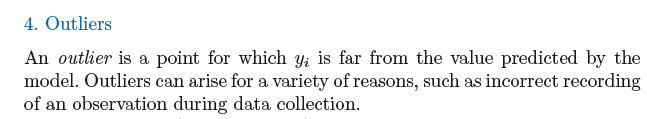

# Bias vs. Variance Tradeoff

Source: An Introduction To Statistical Learning, Pg. 34
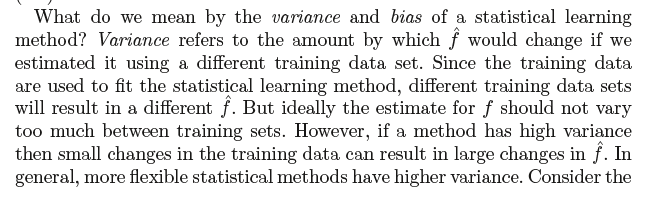


Source: An Introduction To Statistical Learning, Pg. 34
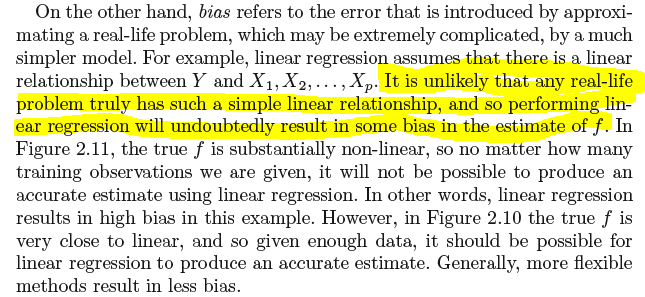



SOURCE OF GRAPHS AND EXPLANATION BELOW: https://towardsdatascience.com/understanding-the-bias-variance-tradeoff-165e6942b229
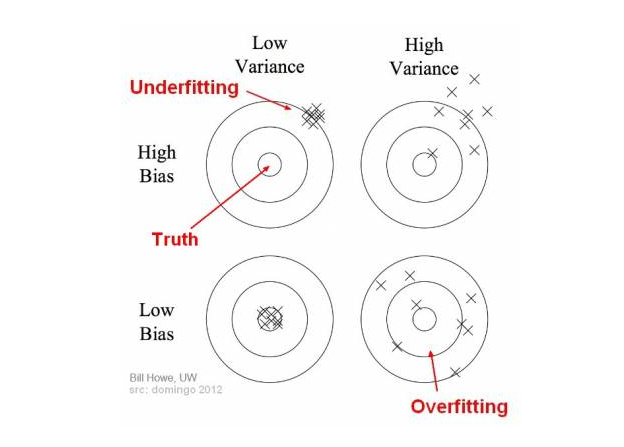

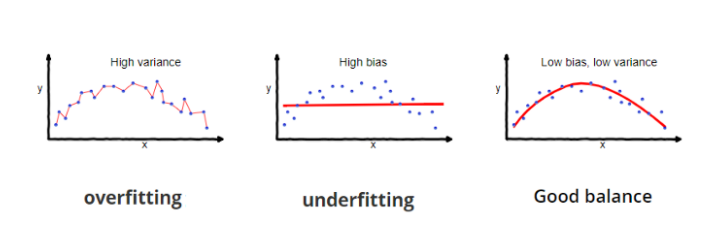


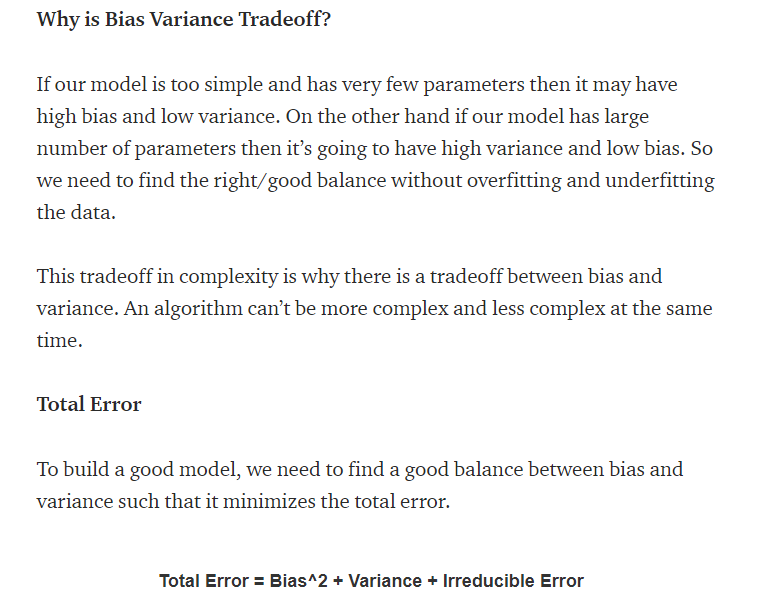

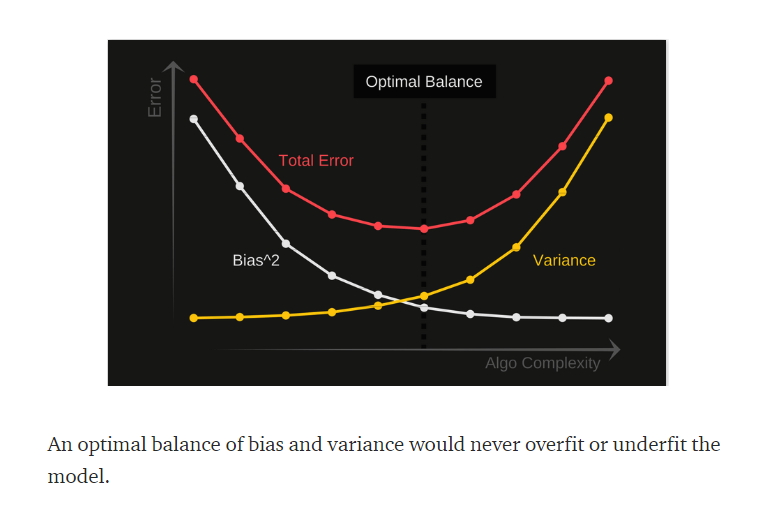

# Cross Validation

SOURCE: Source: An Introduction To Statistical Learning, Pg. 181-184

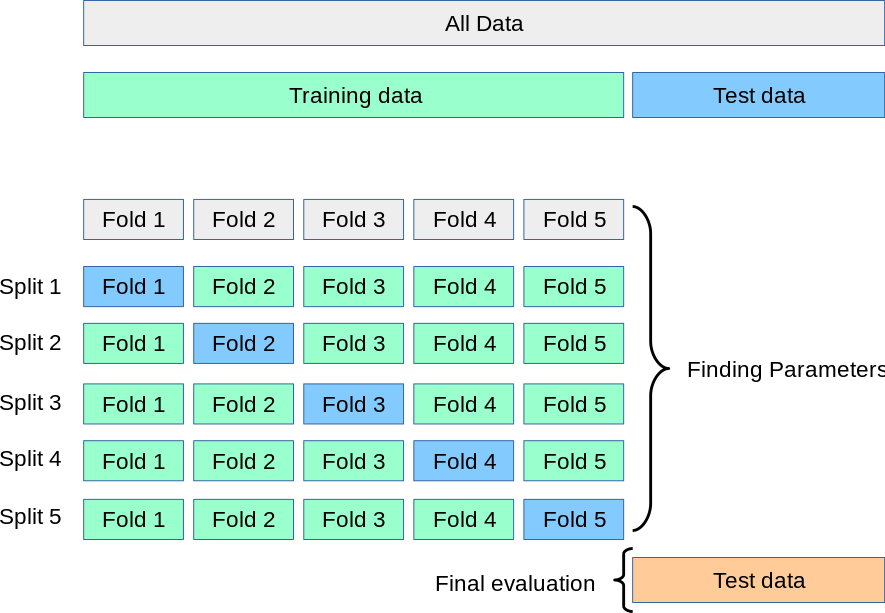

SOURCE: Scikit-learn

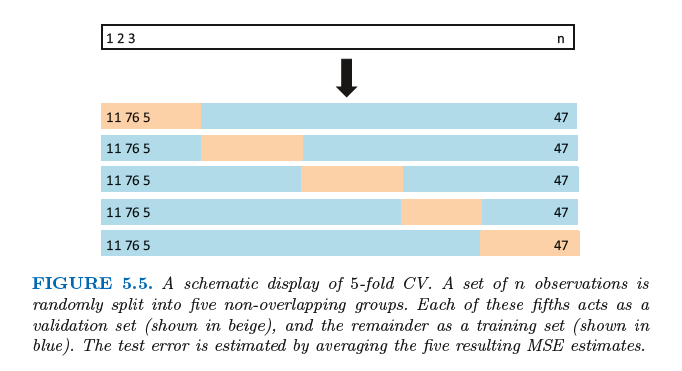


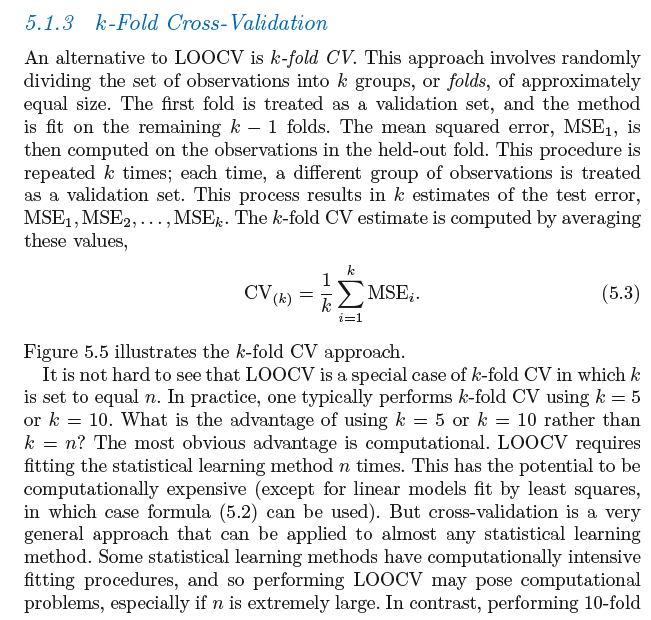

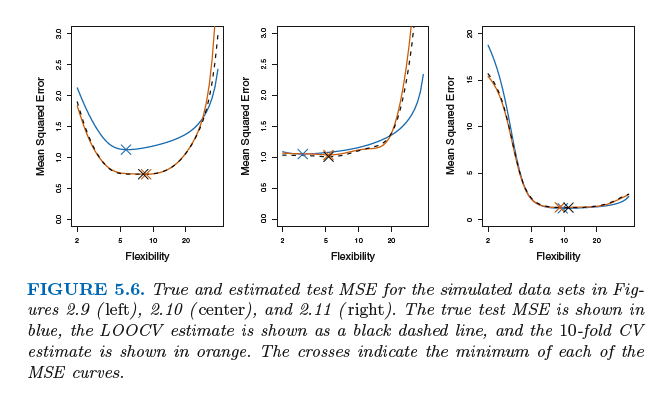

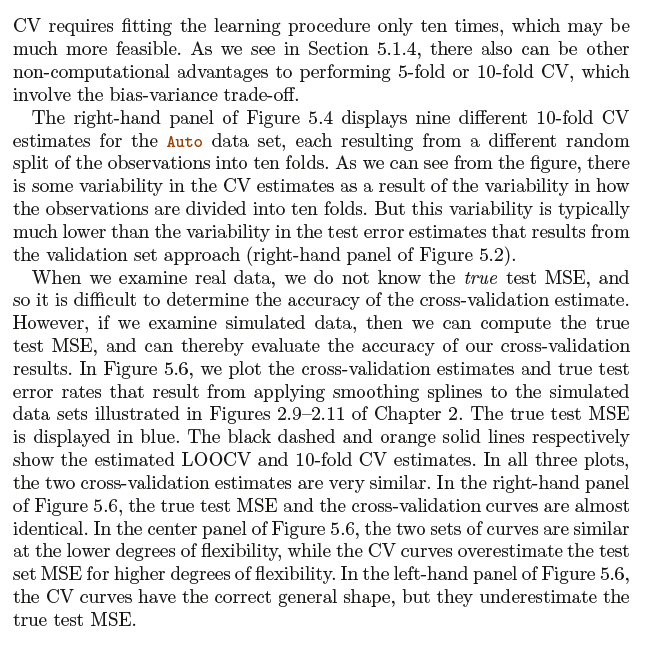

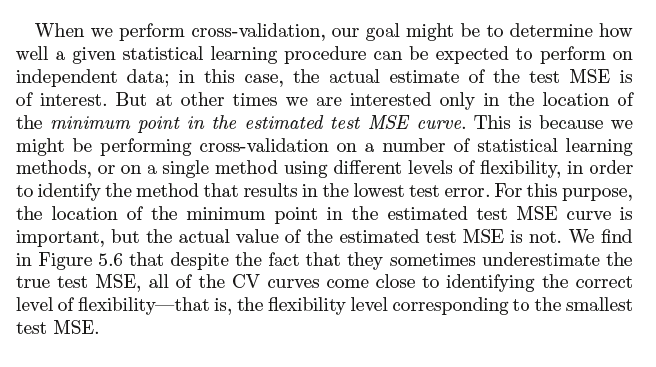

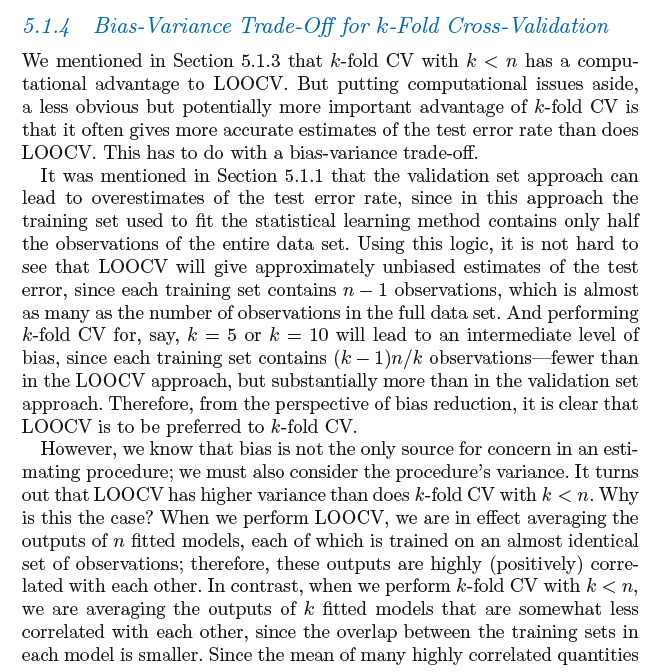

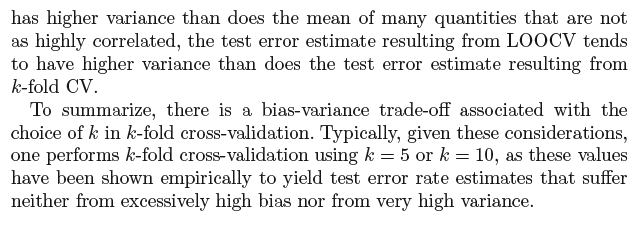

# Ridge Regression (Shrinkage Methods)

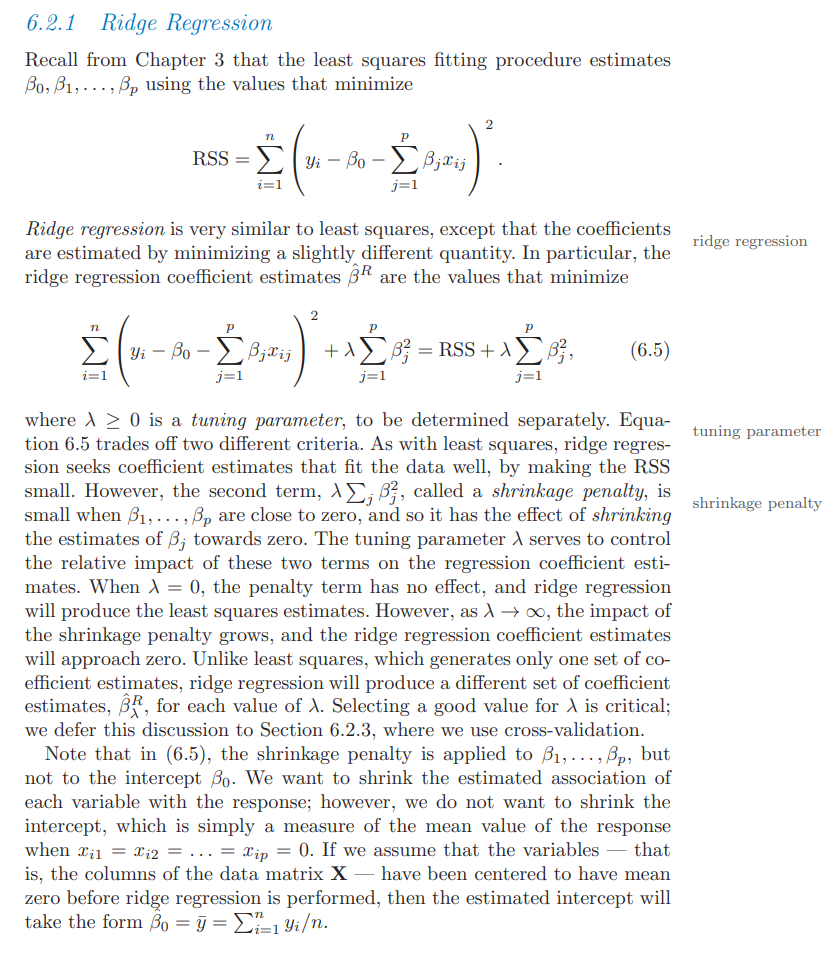

<b>Source:</b> Source:  An Introduction to Statistical Learning, Pg. 217, Section 6.2 Shrinkage Methods

# LASSO

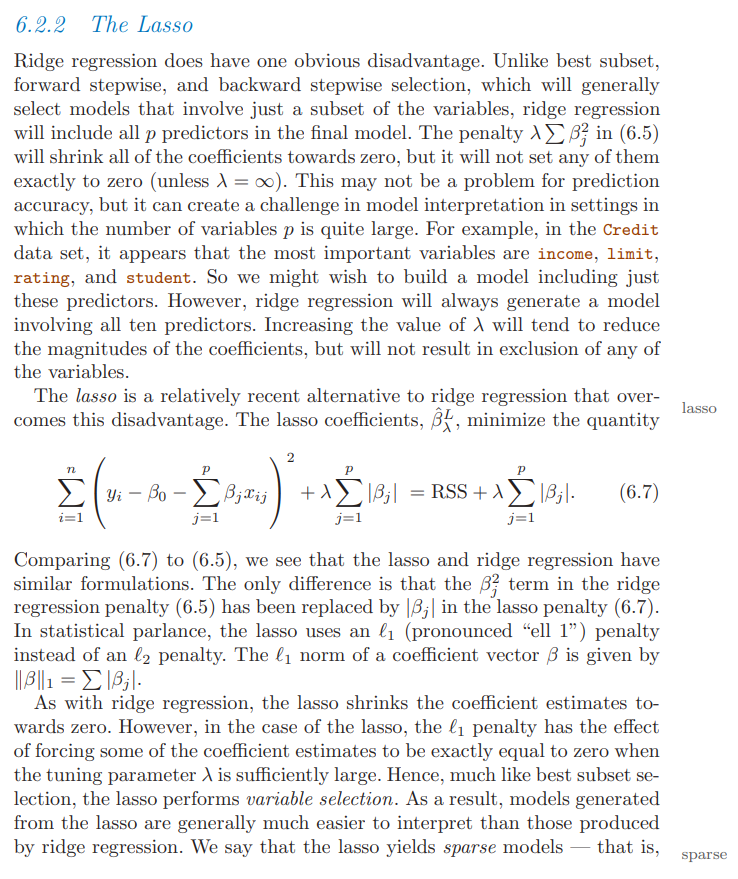

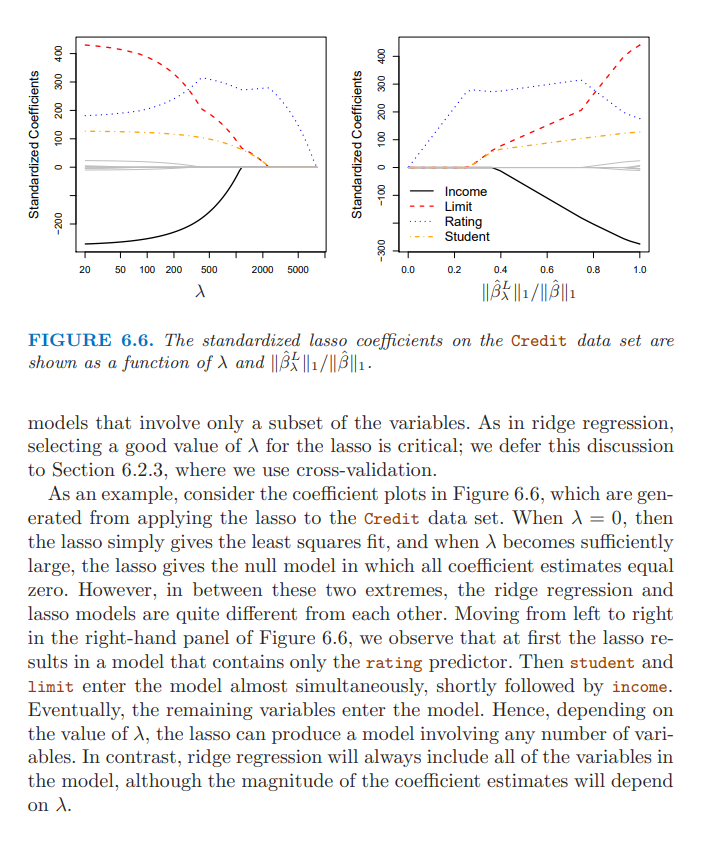

# Data Science Process Using (CRISP-DM): CRoss Industry Stanard Process for Data Mining

Full manual: https://the-modeling-agency.com/crisp-dm.pdf

## History of CRISP-DM


SOURCE: WIKIPEDIA https://en.wikipedia.org/wiki/Cross-industry_standard_process_for_data_mining

CRISP-DM was conceived in 1996 and became a European Union project under the ESPRIT funding initiative in 1997. The project was led by five companies: Integral Solutions Ltd (ISL), Teradata, Daimler AG, NCR Corporation and OHRA, an insurance company.

This core consortium brought different experiences to the project: ISL, later acquired and merged into SPSS. The computer giant NCR Corporation produced the Teradata data warehouse and its own data mining software. Daimler-Benz had a significant data mining team. OHRA was just starting to explore the potential use of data mining.

The first version of the methodology was presented at the 4th CRISP-DM SIG Workshop in Brussels in March 1999,[5] and published as a step-by-step data mining guide later that year.[6]

Between 2006 and 2008 a CRISP-DM 2.0 SIG was formed and there were discussions about updating the CRISP-DM process model.[7] The current status of these efforts is not known. However, the original crisp-dm.org website cited in the reviews,[8][9] and the CRISP-DM 2.0 SIG website[7] are both no longer active.

While many non-IBM data mining practitioners use CRISP-DM,[10][11][12] IBM is the primary corporation that currently uses the CRISP-DM process model. It makes some of the old CRISP-DM documents available for download[6] and it has incorporated it into its SPSS Modeler product.

Based on current research CRISP-DM is the most widely used form of data-mining model because of its various advantages which solved the existing problems in the data mining industries. Some of the drawbacks of this model is that it does not perform project management activities. The fact behind the success of CRISP-DM is that it is industry, tool, and application neutral.[13]

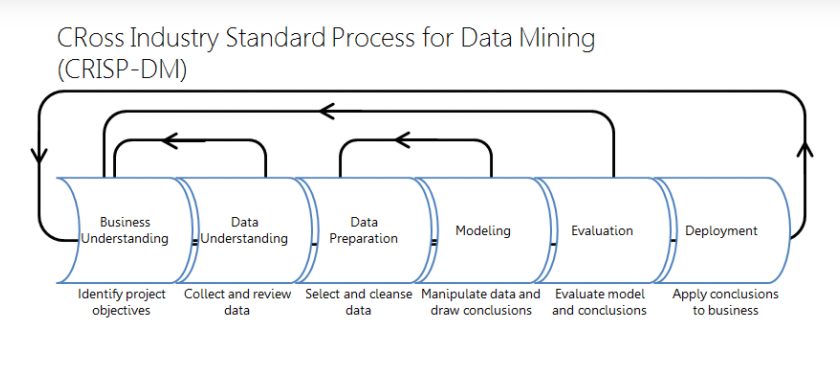

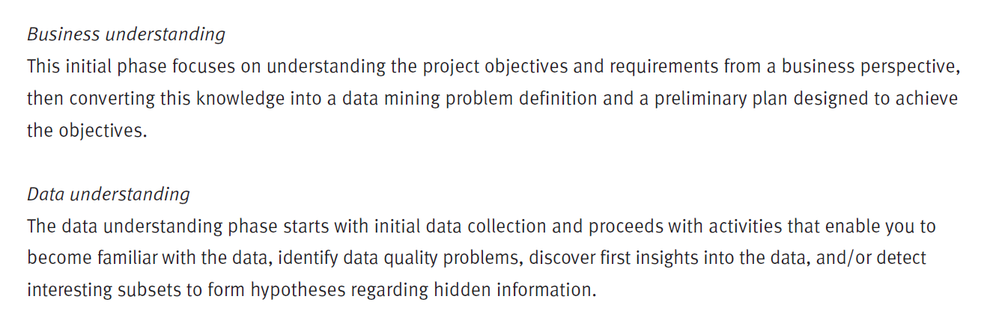

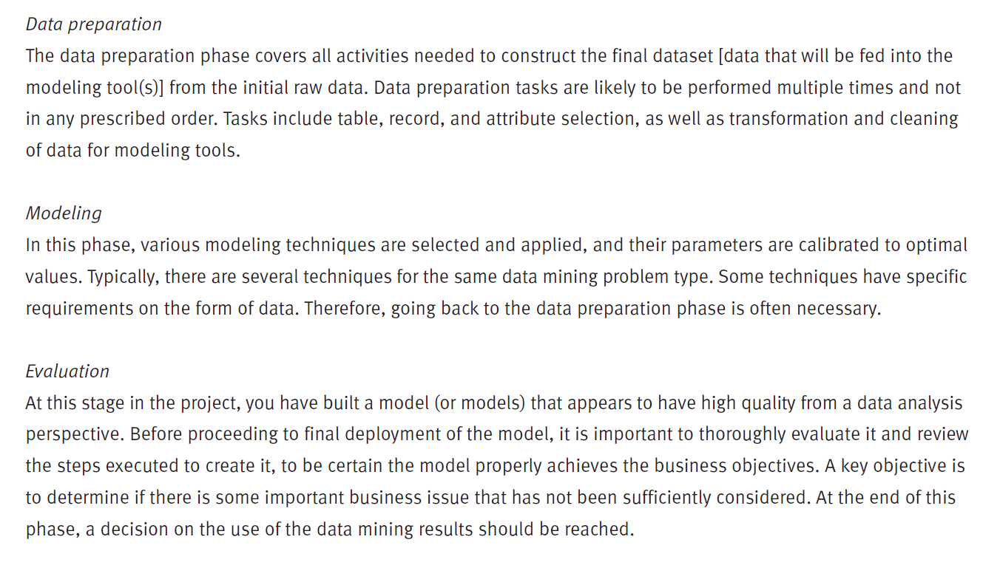

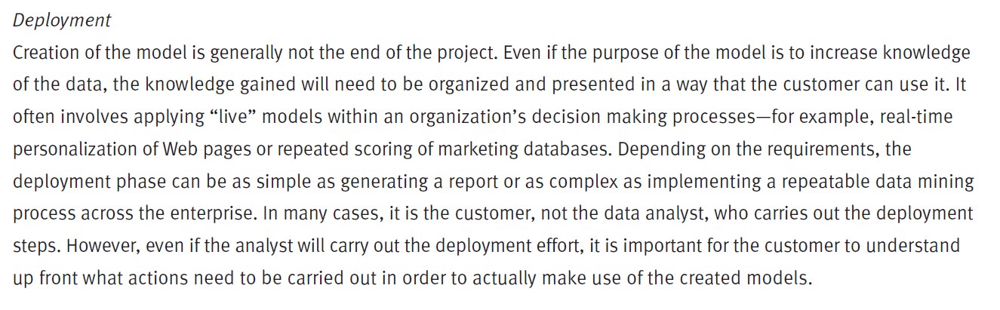

# Step 1:  Business Understanding:  We are given a data set that includes the features of various cars, and the cost of each car.  Some of the data is also missing.  We are tasked to build a model that predicts the automobile's price.  

We will attempt to model the price of the vehicle based on it's various characteristics

# Step 2:  Data Understanding:  Collect and review the data

## Original Dataset
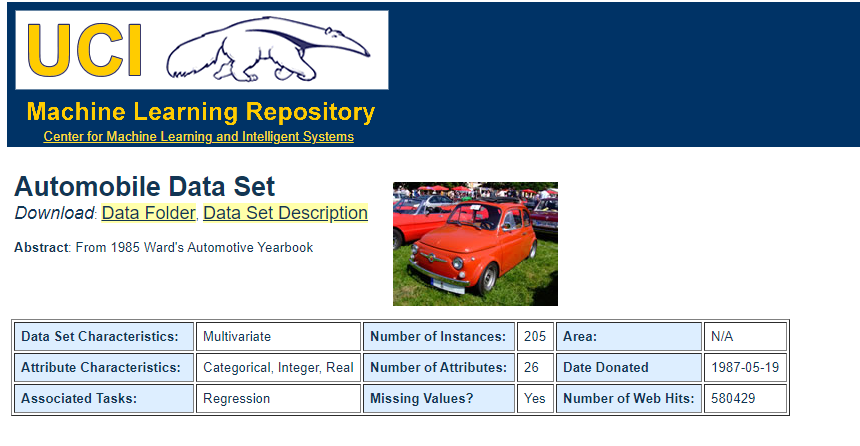


## The full and clean dataset is downloadable on Kaggle
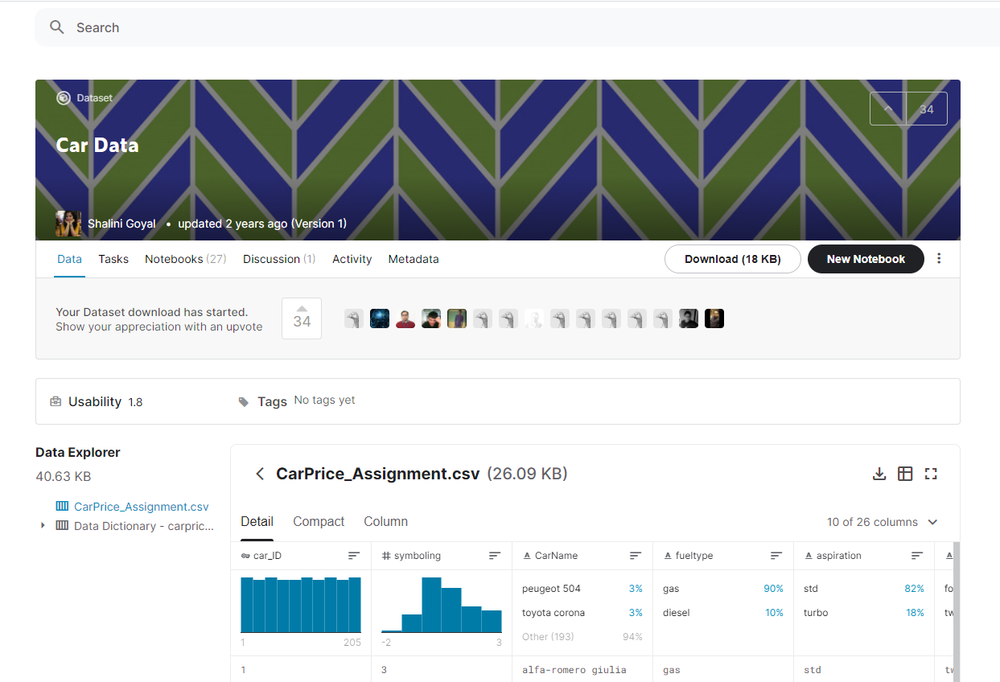

SOURCE: https://www.kaggle.com/goyalshalini93/car-data?select=CarPrice_Assignment.csv#

## Data Dictionary

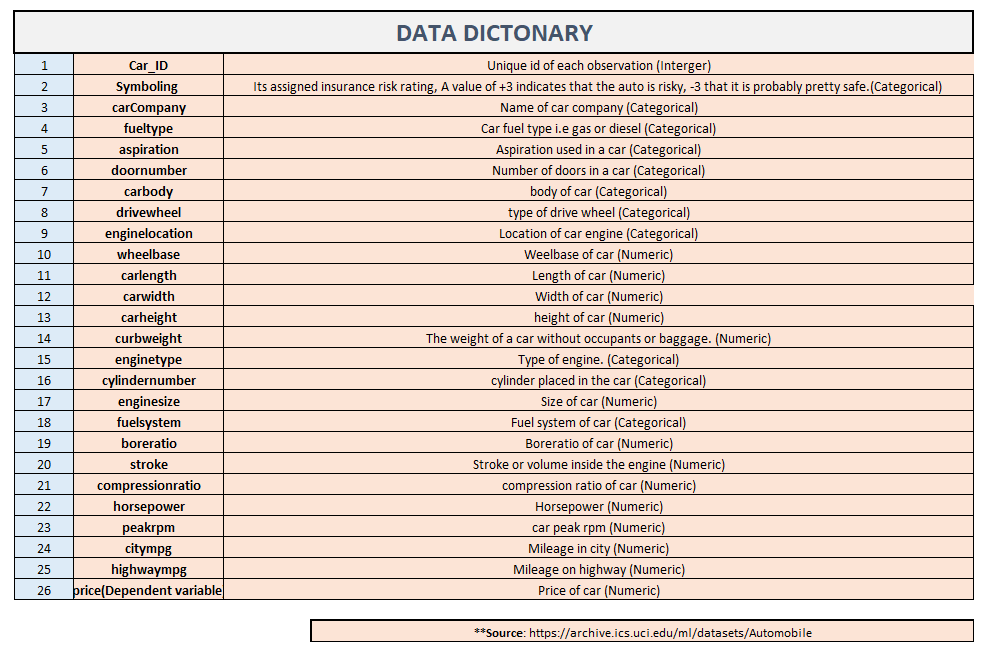

## Dependencies

In [44]:
import pandas as pd
import numpy as np
import datetime as dt
import os 
import warnings
import statsmodels.api as sm   

import matplotlib.ticker as ticker
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor

from IPython.display import HTML

from pandas_datareader import data
import matplotlib.ticker as ticker 

from sklearn.ensemble import GradientBoostingRegressor

import warnings
warnings.filterwarnings('ignore')


## Read in data and do a preliminary view

In [45]:
file_location = './auto_prices.pkl'
df = pd.read_pickle(file_location)

In [46]:
# display a data summary 
display(df.info())
display(df.describe())
display(df.head(3))
display(df.tail(3))
display(df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   make               205 non-null    object 
 1   fuel-type          205 non-null    object 
 2   aspiration         205 non-null    object 
 3   num-of-doors       205 non-null    object 
 4   body-style         205 non-null    object 
 5   drive-wheels       205 non-null    object 
 6   engine-location    205 non-null    object 
 7   wheel-base         205 non-null    float64
 8   length             205 non-null    float64
 9   width              205 non-null    float64
 10  height             205 non-null    float64
 11  curb-weight        205 non-null    int64  
 12  engine-type        205 non-null    object 
 13  num-of-cylinders   205 non-null    object 
 14  engine-size        205 non-null    int64  
 15  fuel-system        205 non-null    object 
 16  bore               205 non

None

,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,city-mpg,highway-mpg
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,10.142537,25.219512,30.751220
std,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,3.972040,6.542142,6.886443
min,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,7.000000,13.000000,16.000000
25%,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,8.600000,19.000000,25.000000
50%,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,9.000000,24.000000,30.000000
75%,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,9.400000,30.000000,34.000000
max,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,23.000000,49.000000,54.000000


,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500


,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
202,volvo,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
203,volvo,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.4,23.0,106,4800,26,27,22470
204,volvo,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3062,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,19,25,22625


(205, 24)

## Look at all the data

In [47]:
pd.options.display.max_rows = 250       #Increases the number of rows displayed without a break in the middle.
pd.options.display.max_columns = 30     #Increases the number of columns displayed without a break in the middle.
pd.set_option('max_colwidth',100)       #Increases the width of the columns to display 100 characters at the same time.

In [49]:
df.head(40)

,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,13495
1,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.00,111,5000,21,27,16500
2,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.00,154,5000,19,26,16500
3,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.4,10.00,102,5500,24,30,13950
4,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.4,8.00,115,5500,18,22,17450
5,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,five,136,mpfi,3.19,3.4,8.50,110,5500,19,25,15250
6,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.4,8.50,110,5500,19,25,17710
7,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,five,136,mpfi,3.19,3.4,8.50,110,5500,19,25,18920
8,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.4,8.30,140,5500,17,20,23875
9,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,five,131,mpfi,3.13,3.4,7.00,160,5500,16,22,?


## Examine the data in each of the columns to look at the unique values and see if there are additional data quality issues.

In [50]:
def check_numeric(val):
    try:
        test = float(val)
        return True

    except ValueError:
        return False
    
for col in df.columns:
    
    vals = set([val for val in df[col].values if check_numeric(val) == False])
    if len(vals)>0:
        
        print('|{:<18}  | {} '.format(str(col), vals))

    else:
        print('|{:<18}  | {} '.format(str(col), 'All Numbers'))  

|make                | {'isuzu', 'renault', 'peugot', 'toyota', 'volkswagen', 'nissan', 'mercedes-benz', 'porsche', 'mazda', 'saab', 'subaru', 'mercury', 'mitsubishi', 'audi', 'jaguar', 'alfa-romero', 'bmw', 'dodge', 'honda', 'chevrolet', 'volvo', 'plymouth'} 
|fuel-type           | {'gas', 'diesel'} 
|aspiration          | {'turbo', 'std'} 
|num-of-doors        | {'four', 'two', '?'} 
|body-style          | {'hatchback', 'sedan', 'hardtop', 'convertible', 'wagon'} 
|drive-wheels        | {'4wd', 'rwd', 'fwd'} 
|engine-location     | {'rear', 'front'} 
|wheel-base          | All Numbers 
|length              | All Numbers 
|width               | All Numbers 
|height              | All Numbers 
|curb-weight         | All Numbers 
|engine-type         | {'ohc', 'dohc', 'l', 'rotor', 'ohcv', 'dohcv', 'ohcf'} 
|num-of-cylinders    | {'three', 'twelve', 'eight', 'six', 'four', 'two', 'five'} 
|engine-size         | All Numbers 
|fuel-system         | {'2bbl', 'mpfi', 'spfi', 'mfi', '4bbl', 

## Columns that should be categorical values
- make
- fuel-type
- aspiration
- body-style
- drive-wheels
- engine-location
- engine-type
- fuel-system



## All column that should be numerical values


- wheel-base 
- length     
- width
- height
- curb-weight  

- num-of-cylinders (Needs to be converted)

- fuel-system
- bore
- stroke
- compression-ratio
- horsepower
- peak-rpm
- city-mpg
- highway-mpg
- price



## Columns with question marks (all should be numerical):
- num-of-cylinders (Needs to stay categorical)
- bore
- stroke
- horsepower
- peak-rpm
- price

## Total columns to convert to numeric
- num-of-doors 
- num-of-cylinders
- bore
- stroke
- horsepower
- peak-rpm
- price

 ## convert columns to numbers and ?'s to NaN's

In [51]:
print(df['num-of-doors'].unique())
print(df['num-of-cylinders'].unique())

['two' 'four' '?']
['four' 'six' 'five' 'three' 'twelve' 'two' 'eight']


In [52]:
# convert the num-of-doors and cynlinders

# num-of-doors (Needs to stay categorical)
# bore
# stroke
# horsepower
# peak-rpm
# price
# e

df['num-of-cylinders'].loc[df['num-of-cylinders'] == 'four']  = 4
df['num-of-cylinders'].loc[df['num-of-cylinders'] == 'six']   = 6
df['num-of-cylinders'].loc[df['num-of-cylinders'] == 'five']  = 5
df['num-of-cylinders'].loc[df['num-of-cylinders'] == 'three'] = 3
df['num-of-cylinders'].loc[df['num-of-cylinders'] == 'twelve']= 12
df['num-of-cylinders'].loc[df['num-of-cylinders'] == 'two']   = 2
df['num-of-cylinders'].loc[df['num-of-cylinders'] == 'eight'] = 8

# convert columns to numeric and ? to np.nan

columns_to_covert = ['num-of-cylinders','bore','stroke','horsepower','peak-rpm','price']
df[columns_to_covert] = df[columns_to_covert].apply(pd.to_numeric, errors='coerce')

df['num-of-doors'].loc[df['num-of-doors'] == '?'] = np.nan

display(df.info())
print('Numeric Column/ Features')
display(df.select_dtypes(include='number').head())
print('Objects')
display(df.select_dtypes(include='object').head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   make               205 non-null    object 
 1   fuel-type          205 non-null    object 
 2   aspiration         205 non-null    object 
 3   num-of-doors       203 non-null    object 
 4   body-style         205 non-null    object 
 5   drive-wheels       205 non-null    object 
 6   engine-location    205 non-null    object 
 7   wheel-base         205 non-null    float64
 8   length             205 non-null    float64
 9   width              205 non-null    float64
 10  height             205 non-null    float64
 11  curb-weight        205 non-null    int64  
 12  engine-type        205 non-null    object 
 13  num-of-cylinders   205 non-null    int64  
 14  engine-size        205 non-null    int64  
 15  fuel-system        205 non-null    object 
 16  bore               201 non

None

Numeric Column/ Features


,wheel-base,length,width,height,curb-weight,num-of-cylinders,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,88.6,168.8,64.1,48.8,2548,4,130,3.47,2.68,9.0,111.0,5000.0,21,27,13495.0
1,88.6,168.8,64.1,48.8,2548,4,130,3.47,2.68,9.0,111.0,5000.0,21,27,16500.0
2,94.5,171.2,65.5,52.4,2823,6,152,2.68,3.47,9.0,154.0,5000.0,19,26,16500.0
3,99.8,176.6,66.2,54.3,2337,4,109,3.19,3.40,10.0,102.0,5500.0,24,30,13950.0
4,99.4,176.6,66.4,54.3,2824,5,136,3.19,3.40,8.0,115.0,5500.0,18,22,17450.0


Objects


,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,engine-type,fuel-system
0,alfa-romero,gas,std,two,convertible,rwd,front,dohc,mpfi
1,alfa-romero,gas,std,two,convertible,rwd,front,dohc,mpfi
2,alfa-romero,gas,std,two,hatchback,rwd,front,ohcv,mpfi
3,audi,gas,std,four,sedan,fwd,front,ohc,mpfi
4,audi,gas,std,four,sedan,4wd,front,ohc,mpfi


## Variable exploration with histograms and boxplots

In [53]:
data = df['length']
alpha = 0.5

In [55]:

def shapiro_wilk_test(data, alpha = 0.5, print_result=False):
    
    """
    This function conducts a Shapiro-Wilk Test for normality on a data series.

    The Shapiro-Wilk test, proposed in 1965, calculates a W statistic that tests whether a 
    random sample, x1,x2,…,xn comes from (specifically) a normal distribution . Small values 
    of W are evidence of departure from normality.

    Source: US Department of Commerce, National Institute of Standards and Technology (NIST) 
    https://www.itl.nist.gov/div898/handbook/prc/section2/prc213.htm

    Parameters: 
        
        data: array of sample data
        alpha: test threshold
        print_result: selected if printed results are desired
        
    Returns: string with the test results
    """

    # library file
    from scipy.stats import shapiro

    # normality test
    w_statistic, p_value = shapiro(data)

    # interpret
    if p_value > alpha:

        result = ' > alpha = {:0.5f}'.format(alpha)
        conclusion = "Gaussian (Don't reject H{})".format('\u2092') 

    else:
        result = ' < alpha = {:0.5f}'.format(alpha)
        conclusion = "Not Gaussian (Reject H{})".format('\u2092') 

    result_string = 'W statistic = {:0.5f}\np = {:0.5f}{}\n{}'.format(w_statistic, p_value, result, conclusion)
    
    if print_result == True:
        print(result_string)
    
    return result_string



### histograms and tests for normality

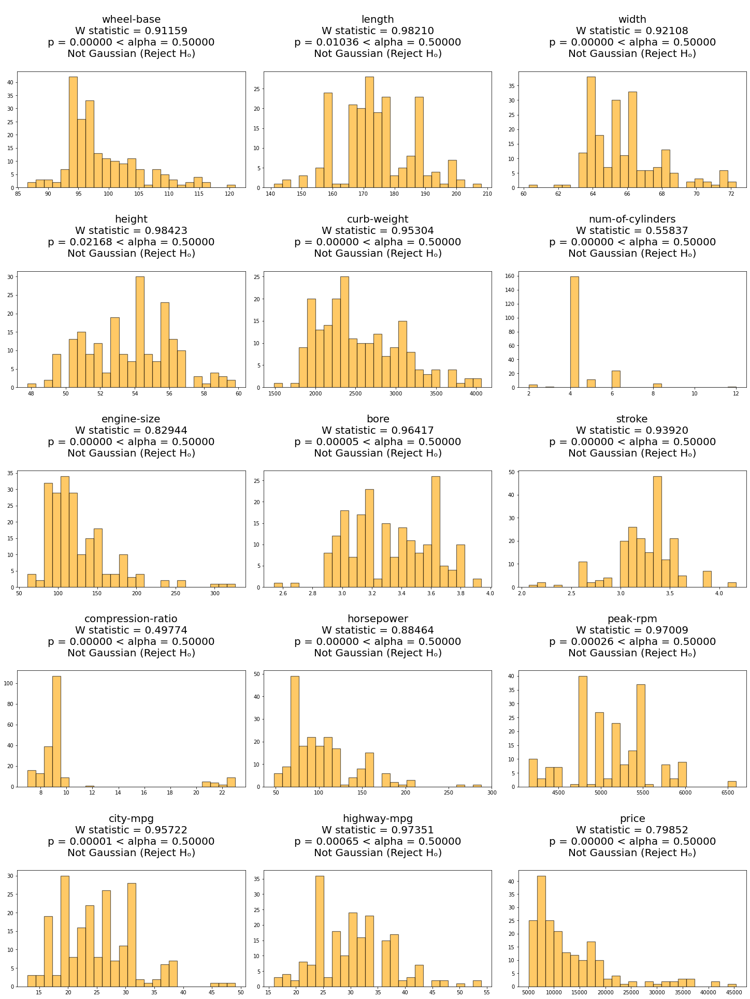

In [56]:
features = df.select_dtypes(include='number').columns.to_list()
figsize = (20, 30)
cols = 3
rows = len(features) // cols + 1

def trim_axs(axs, N):
    """
    Reduce *axs* to *N* Axes. All further Axes are removed from the figure.
    """
    axs = axs.flat
    
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

axs = plt.figure(figsize=figsize, constrained_layout=True).subplots(rows, cols)
axs = trim_axs(axs, len(features))
for ax, feature in zip(axs, features):
    
    data = df[feature].dropna()
    test_result_string = shapiro_wilk_test(data, alpha = 0.5, print_result=False)
    str_title = '\n{}\n{}\n'.format(feature,test_result_string)
    ax.set_title(str_title, fontsize = 20)
    ax.hist(data, bins = 25, color = 'orange', alpha = 0.6, edgecolor='black', linewidth=1.2)

### Try a log transformation on the data

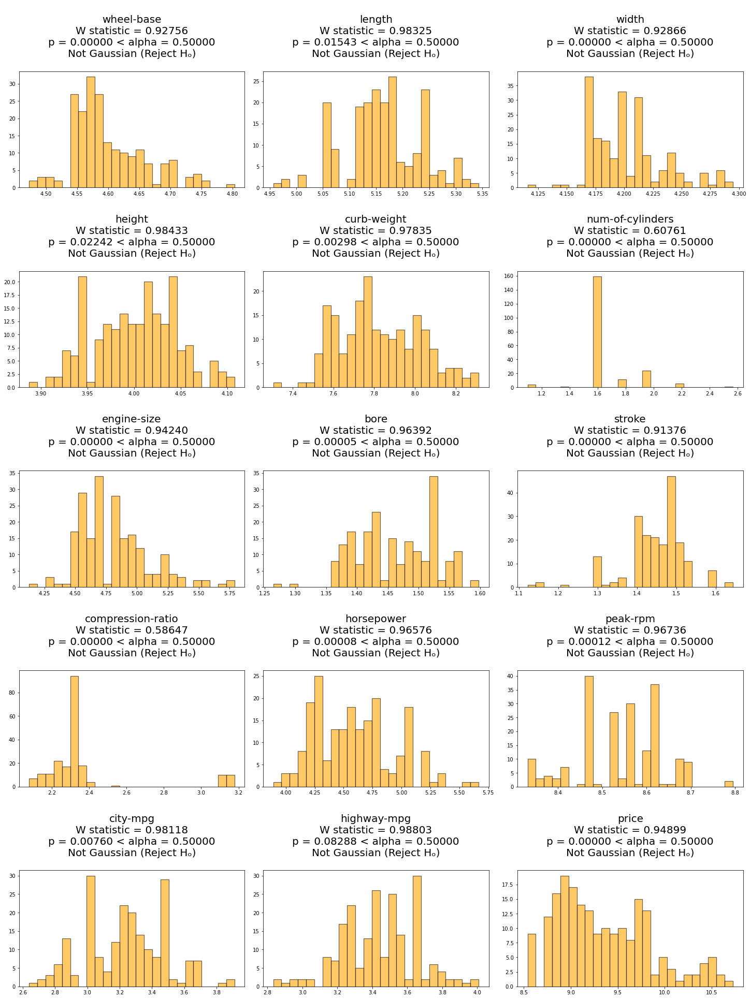

In [57]:
features = df.select_dtypes(include='number').columns.to_list()
figsize = (20, 30)
cols = 3
rows = len(features) // cols + 1

def trim_axs(axs, N):
    """
    Reduce *axs* to *N* Axes. All further Axes are removed from the figure.
    """
    axs = axs.flat
    
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

axs = plt.figure(figsize=figsize, constrained_layout=True).subplots(rows, cols)
axs = trim_axs(axs, len(features))
for ax, feature in zip(axs, features):
    
    data = np.log1p(df[feature].dropna())
    test_result_string = shapiro_wilk_test(data, alpha = 0.5, print_result=False)
    str_title = '\n{}\n{}\n'.format(feature,test_result_string)
    ax.set_title(str_title, fontsize = 20)
    ax.hist(data, bins = 25, color = 'orange', alpha = 0.6, edgecolor='black', linewidth=1.2)

### boxplots

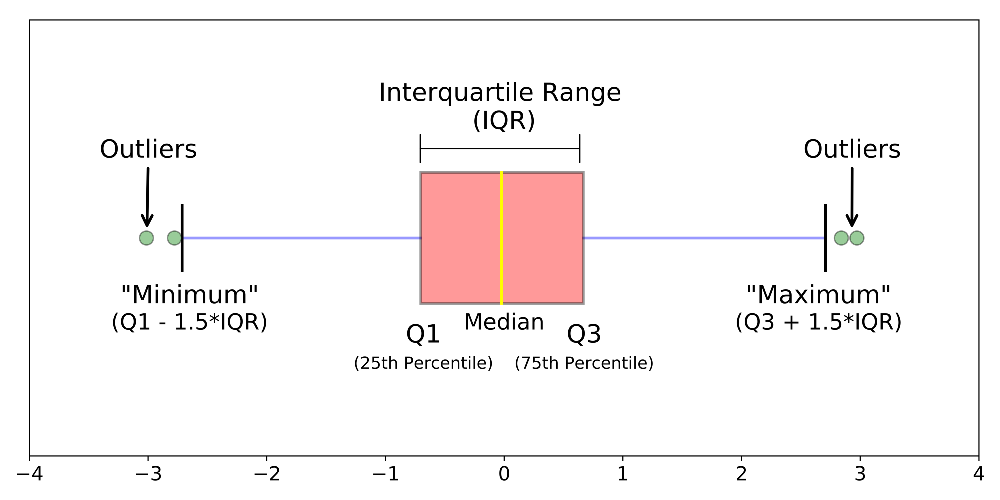

SOURCE: https://towardsdatascience.com/understanding-boxplots-5e2df7bcbd51

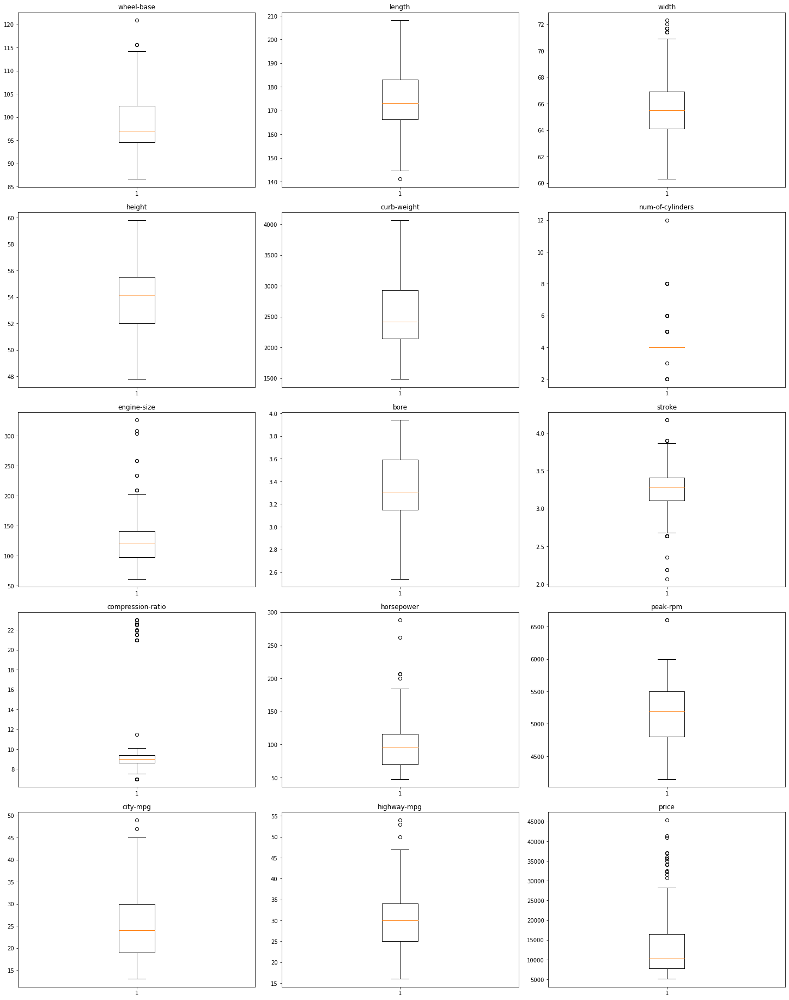

In [58]:
axs = plt.figure(figsize=figsize, constrained_layout=True).subplots(rows, cols)
axs = trim_axs(axs, len(features))
for ax, feature in zip(axs, features):
    ax.set_title('{}'.format(str(feature), fontsize = 20))
    ax.boxplot(df[feature].dropna())

### y vs each numeric feature

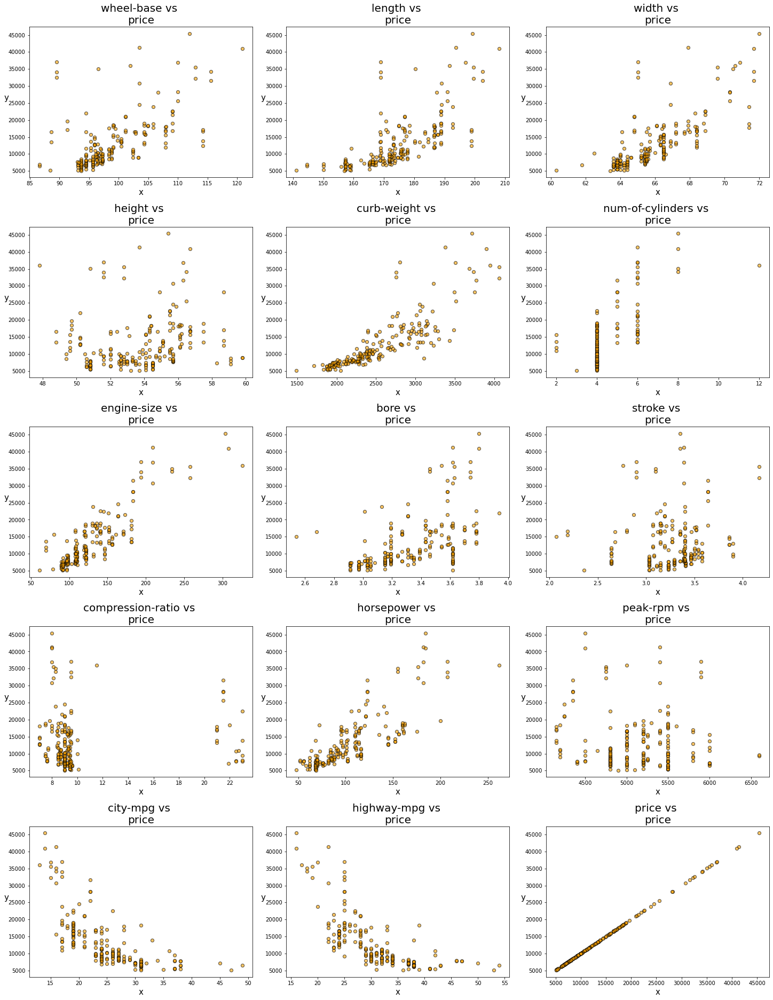

In [59]:
y = df['price']
axs = plt.figure(figsize=figsize, constrained_layout=True).subplots(rows, cols)
axs = trim_axs(axs, len(features))
for ax, feature in zip(axs, features):
    ax.set_title('{} vs \n{}'.format(str(feature), 'price'), fontsize = 20)
    ax.scatter(df[feature], y,color = 'orange', alpha = 0.6, edgecolor='black', linewidth=1.2)
    ax.set_ylabel('y', fontsize = 15, rotation = 0)
    ax.set_xlabel('x', fontsize = 15)

## Try a log transformation and plot y vs each predictor to address heteroskedasticity

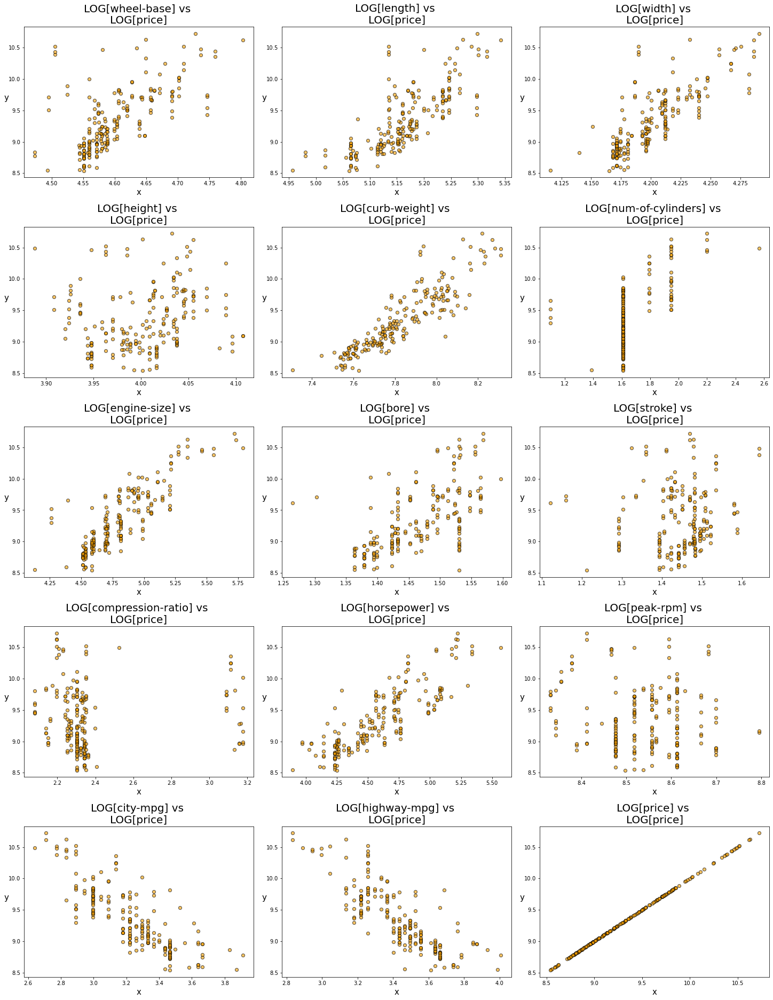

In [60]:
y = df['price']
axs = plt.figure(figsize=figsize, constrained_layout=True).subplots(rows, cols)
axs = trim_axs(axs, len(features))
for ax, feature in zip(axs, features):
    
    data_log = np.log1p(df[feature])
    y_log = np.log1p(y)
    
    ax.set_title('LOG[{}] vs \nLOG[{}]'.format(str(feature), 'price'), fontsize = 20)
    ax.scatter(data_log, y_log,color = 'orange', alpha = 0.6, edgecolor='black', linewidth=1.2)
    ax.set_ylabel('y', fontsize = 15, rotation = 0)
    ax.set_xlabel('x', fontsize = 15)

### Conclusions:
- Some data exhibits heterskedasticity in the form of expanding variance. 
- Log transformation seems to help address the heteroskedasticity which may help with the regression model
- Log transformation does not normalize the data, however this is not necessary to performe a linear regression.
- The number of cylinders was originally categorical, but it exhibits a positive correlation to price. 
- The compression ratio has two clusters, that should either be changed to a categorical variable of 'low' and 'high' or an interaction term should be added.


## Scatterplot matrix of  non-binary numeric predictor variables and look at multicolinearity. 

In [61]:
from pandas.plotting import scatter_matrix

non_binary_cols = [col for col in features if col not in ['price','num-of-doors', 'compression-ratio']]

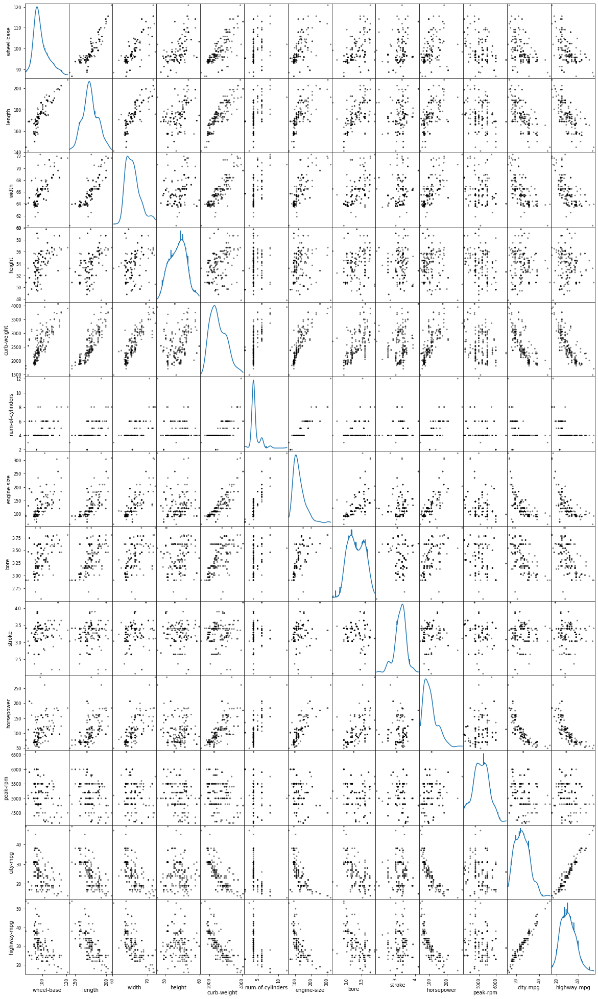

In [21]:
scatter_matrix(df[[col for col in non_binary_cols]], color = 'black', figsize = (20, 35), diagonal = 'kde')
plt.show()

### Correlations Matrix

In [62]:
df[non_binary_cols].corr()

,wheel-base,length,width,height,curb-weight,num-of-cylinders,engine-size,bore,stroke,horsepower,peak-rpm,city-mpg,highway-mpg
wheel-base,1.000000,0.874587,0.795144,0.589435,0.776386,0.339507,0.569329,0.490378,0.161477,0.352297,-0.361052,-0.470414,-0.544082
length,0.874587,1.000000,0.841118,0.491029,0.877728,0.430672,0.683360,0.607480,0.129739,0.555003,-0.287325,-0.670909,-0.704662
width,0.795144,0.841118,1.000000,0.279210,0.867032,0.545007,0.735433,0.559204,0.182956,0.642482,-0.219957,-0.642704,-0.677218
height,0.589435,0.491029,0.279210,1.000000,0.295572,-0.013995,0.067149,0.176195,-0.056999,-0.110711,-0.322272,-0.048640,-0.107358
curb-weight,0.776386,0.877728,0.867032,0.295572,1.000000,0.609727,0.850594,0.649045,0.168929,0.751034,-0.266306,-0.757414,-0.797465
num-of-cylinders,0.339507,0.430672,0.545007,-0.013995,0.609727,1.000000,0.846031,0.243553,0.008578,0.691633,-0.124434,-0.445837,-0.466666
engine-size,0.569329,0.683360,0.735433,0.067149,0.850594,0.846031,1.000000,0.594090,0.206675,0.810773,-0.244618,-0.653658,-0.677470
bore,0.490378,0.607480,0.559204,0.176195,0.649045,0.243553,0.594090,1.000000,-0.055909,0.577273,-0.264269,-0.594584,-0.594572
stroke,0.161477,0.129739,0.182956,-0.056999,0.168929,0.008578,0.206675,-0.055909,1.000000,0.090254,-0.071493,-0.042906,-0.044528
horsepower,0.352297,0.555003,0.642482,-0.110711,0.751034,0.691633,0.810773,0.577273,0.090254,1.000000,0.130971,-0.803620,-0.770908


### List of correlations by each numerical type

In [23]:
correlations = pd.DataFrame(df[non_binary_cols]).corr().unstack()
correlations = pd.DataFrame(correlations)
correlations


0
wheel-base       wheel-base        1.000000
                 length            0.874587
                 width             0.795144
                 height            0.589435
                 curb-weight       0.776386
                 num-of-cylinders  0.339507
                 engine-size       0.569329
                 bore              0.490378
                 stroke            0.161477
                 horsepower        0.352297
                 peak-rpm         -0.361052
                 city-mpg         -0.470414
                 highway-mpg      -0.544082
length           wheel-base        0.874587
                 length            1.000000
                 width             0.841118
                 height            0.491029
                 curb-weight       0.877728
                 num-of-cylinders  0.430672
                 engine-size       0.683360
                 bore              0.607480
                 stroke            0.129739
                 horsepower        0.555003
                 peak-rpm         -0.287325
                 city-mpg         -0.670909
                 highway-mpg      -0.704662
width            wheel-base        0.795144
                 length            0.841118
                 width             1.000000
                 height            0.279210
                 curb-weight       0.867032
                 num-of-cylinders  0.545007
                 engine-size       0.735433
                 bore              0.559204
                 stroke            0.182956
                 horsepower        0.642482
                 peak-rpm         -0.219957
                 city-mpg         -0.642704
                 highway-mpg      -0.677218
height           wheel-base        0.589435
                 length            0.491029
                 width             0.279210
                 height            1.000000
                 curb-weight       0.295572
                 num-of-cylinders -0.013995
                 engine-size       0.067149
                 bore              0.176195
                 stroke           -0.056999
                 horsepower       -0.110711
                 peak-rpm         -0.322272
                 city-mpg         -0.048640
                 highway-mpg      -0.107358
curb-weight      wheel-base        0.776386
                 length            0.877728
                 width             0.867032
                 height            0.295572
                 curb-weight       1.000000
                 num-of-cylinders  0.609727
                 engine-size       0.850594
                 bore              0.649045
                 stroke            0.168929
                 horsepower        0.751034
                 peak-rpm         -0.266306
                 city-mpg         -0.757414
                 highway-mpg      -0.797465
num-of-cylinders wheel-base        0.339507
                 length            0.430672
                 width             0.545007
                 height           -0.013995
                 curb-weight       0.609727
                 num-of-cylinders  1.000000
                 engine-size       0.846031
                 bore              0.243553
                 stroke            0.008578
                 horsepower        0.691633
                 peak-rpm         -0.124434
                 city-mpg         -0.445837
                 highway-mpg      -0.466666
engine-size      wheel-base        0.569329
                 length            0.683360
                 width             0.735433
                 height            0.067149
                 curb-weight       0.850594
                 num-of-cylinders  0.846031
                 engine-size       1.000000
                 bore              0.594090
                 stroke            0.206675
                 horsepower        0.810773
                 peak-rpm         -0.244618
                 city-mpg         -0.653658
                 highway-mpg      -0.6

### Conclusions
- There are high correlations among many features.  Here are some examples that are correlated above or near 0.80:
    - wheel_base vs. length
    - wheel vs. width
    - width vs. curb-weight
    - length vs. curb-weight 
    - engine-size vs. curb-weight
    - engine-size vs. num-of-cylinders
    - engine-size vs. horsepower
    - highway_mpg vs. curb-weight  
    - highway-mpg vs. city-mpg, etc.

# Data Preparation: Select and Cleanse Data

### Create dummy variables

In [63]:
# impute the num-of-cylinders
categorical_vals = df.select_dtypes(include='object').head()
categorical_vals

,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,engine-type,fuel-system
0,alfa-romero,gas,std,two,convertible,rwd,front,dohc,mpfi
1,alfa-romero,gas,std,two,convertible,rwd,front,dohc,mpfi
2,alfa-romero,gas,std,two,hatchback,rwd,front,ohcv,mpfi
3,audi,gas,std,four,sedan,fwd,front,ohc,mpfi
4,audi,gas,std,four,sedan,4wd,front,ohc,mpfi


In [65]:
df['fuel-system'].unique()

array(['mpfi', '2bbl', 'mfi', '1bbl', 'spfi', '4bbl', 'idi', 'spdi'],
      dtype=object)

In [66]:
df_dummies = pd.DataFrame()
dummies_cols = []

for col in categorical_vals.columns:
    
    dummies = pd.get_dummies(df[col], prefix = str(col))
    df_dummies = pd.concat([df_dummies, dummies], axis = 1)
    dummies_cols.append(dummies.columns.to_list())

df = pd.concat([df,df_dummies], axis = 1)

print(dummies_cols)
display(df_dummies.head())
display(df.head())

[['make-_alfa-romero', 'make-_audi', 'make-_bmw', 'make-_chevrolet', 'make-_dodge', 'make-_honda', 'make-_isuzu', 'make-_jaguar', 'make-_mazda', 'make-_mercedes-benz', 'make-_mercury', 'make-_mitsubishi', 'make-_nissan', 'make-_peugot', 'make-_plymouth', 'make-_porsche', 'make-_renault', 'make-_saab', 'make-_subaru', 'make-_toyota', 'make-_volkswagen', 'make-_volvo'], ['fuel-type-_diesel', 'fuel-type-_gas'], ['aspiration-_std', 'aspiration-_turbo'], ['num-of-doors-_four', 'num-of-doors-_two'], ['body-style-_convertible', 'body-style-_hardtop', 'body-style-_hatchback', 'body-style-_sedan', 'body-style-_wagon'], ['drive-wheels-_4wd', 'drive-wheels-_fwd', 'drive-wheels-_rwd'], ['engine-location-_front', 'engine-location-_rear'], ['engine-type-_dohc', 'engine-type-_dohcv', 'engine-type-_l', 'engine-type-_ohc', 'engine-type-_ohcf', 'engine-type-_ohcv', 'engine-type-_rotor'], ['fuel-system-_1bbl', 'fuel-system-_2bbl', 'fuel-system-_4bbl', 'fuel-system-_idi', 'fuel-system-_mfi', 'fuel-system-

,make-_alfa-romero,make-_audi,make-_bmw,make-_chevrolet,make-_dodge,make-_honda,make-_isuzu,make-_jaguar,make-_mazda,make-_mercedes-benz,make-_mercury,make-_mitsubishi,make-_nissan,make-_peugot,make-_plymouth,...,engine-type-_dohc,engine-type-_dohcv,engine-type-_l,engine-type-_ohc,engine-type-_ohcf,engine-type-_ohcv,engine-type-_rotor,fuel-system-_1bbl,fuel-system-_2bbl,fuel-system-_4bbl,fuel-system-_idi,fuel-system-_mfi,fuel-system-_mpfi,fuel-system-_spdi,fuel-system-_spfi
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
3,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,...,engine-type-_dohc,engine-type-_dohcv,engine-type-_l,engine-type-_ohc,engine-type-_ohcf,engine-type-_ohcv,engine-type-_rotor,fuel-system-_1bbl,fuel-system-_2bbl,fuel-system-_4bbl,fuel-system-_idi,fuel-system-_mfi,fuel-system-_mpfi,fuel-system-_spdi,fuel-system-_spfi
0,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,4,130,...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,4,130,...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,6,152,...,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
3,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,4,109,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
4,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,5,136,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [67]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 77 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   make                     205 non-null    object 
 1   fuel-type                205 non-null    object 
 2   aspiration               205 non-null    object 
 3   num-of-doors             203 non-null    object 
 4   body-style               205 non-null    object 
 5   drive-wheels             205 non-null    object 
 6   engine-location          205 non-null    object 
 7   wheel-base               205 non-null    float64
 8   length                   205 non-null    float64
 9   width                    205 non-null    float64
 10  height                   205 non-null    float64
 11  curb-weight              205 non-null    int64  
 12  engine-type              205 non-null    object 
 13  num-of-cylinders         205 non-null    int64  
 14  engine-size              2

# Impute Variables
List of columns with ? variables

In [69]:
# list of columns with np.nan in them 

cols = (df.isna().any() == True)                    #series of nan values == True
nan_cols = cols.loc[cols == True].index.to_list()   #index is the col names of the nan values
nan_cols

['num-of-doors', 'bore', 'stroke', 'horsepower', 'peak-rpm', 'price']

## remove any rows where the target variable is a NaN value

In [70]:
df

,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,...,engine-type-_dohc,engine-type-_dohcv,engine-type-_l,engine-type-_ohc,engine-type-_ohcf,engine-type-_ohcv,engine-type-_rotor,fuel-system-_1bbl,fuel-system-_2bbl,fuel-system-_4bbl,fuel-system-_idi,fuel-system-_mfi,fuel-system-_mpfi,fuel-system-_spdi,fuel-system-_spfi
0,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,4,130,...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,4,130,...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,6,152,...,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
3,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,4,109,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
4,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,5,136,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
5,audi,gas,std,two,sedan,fwd,front,99.8,177.3,66.3,53.1,2507,ohc,5,136,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
6,audi,gas,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,5,136,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
7,audi,gas,std,four,wagon,fwd,front,105.8,192.7,71.4,55.7,2954,ohc,5,136,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
8,audi,gas,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,5,131,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
9,audi,gas,turbo,two,hatchback,4wd,front,99.5,178.2,67.9,52.0,3053,ohc,5,131,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


### Assign Modeling Data Before Imputing Variables


In [71]:
categorical_vals

,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,engine-type,fuel-system
0,alfa-romero,gas,std,two,convertible,rwd,front,dohc,mpfi
1,alfa-romero,gas,std,two,convertible,rwd,front,dohc,mpfi
2,alfa-romero,gas,std,two,hatchback,rwd,front,ohcv,mpfi
3,audi,gas,std,four,sedan,fwd,front,ohc,mpfi
4,audi,gas,std,four,sedan,4wd,front,ohc,mpfi


In [72]:
mod_df = df[[col for col in df.columns if col not in categorical_vals]]
mod_df.head()

,wheel-base,length,width,height,curb-weight,num-of-cylinders,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,...,engine-type-_dohc,engine-type-_dohcv,engine-type-_l,engine-type-_ohc,engine-type-_ohcf,engine-type-_ohcv,engine-type-_rotor,fuel-system-_1bbl,fuel-system-_2bbl,fuel-system-_4bbl,fuel-system-_idi,fuel-system-_mfi,fuel-system-_mpfi,fuel-system-_spdi,fuel-system-_spfi
0,88.6,168.8,64.1,48.8,2548,4,130,3.47,2.68,9.0,111.0,5000.0,21,27,13495.0,...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,88.6,168.8,64.1,48.8,2548,4,130,3.47,2.68,9.0,111.0,5000.0,21,27,16500.0,...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,94.5,171.2,65.5,52.4,2823,6,152,2.68,3.47,9.0,154.0,5000.0,19,26,16500.0,...,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
3,99.8,176.6,66.2,54.3,2337,4,109,3.19,3.40,10.0,102.0,5500.0,24,30,13950.0,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
4,99.4,176.6,66.4,54.3,2824,5,136,3.19,3.40,8.0,115.0,5500.0,18,22,17450.0,...,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


# remove values with NaN's in the target

In [73]:
mod_df = mod_df.loc[mod_df['price'].notnull()]
print((mod_df['price'].isna().any() == True))
mod_df['price'].unique()

False


array([13495., 16500., 13950., 17450., 15250., 17710., 18920., 23875.,
       16430., 16925., 20970., 21105., 24565., 30760., 41315., 36880.,
        5151.,  6295.,  6575.,  5572.,  6377.,  7957.,  6229.,  6692.,
        7609.,  8558.,  8921., 12964.,  6479.,  6855.,  5399.,  6529.,
        7129.,  7295.,  7895.,  9095.,  8845., 10295., 12945., 10345.,
        6785., 11048., 32250., 35550., 36000.,  5195.,  6095.,  6795.,
        6695.,  7395., 10945., 11845., 13645., 15645.,  8495., 10595.,
       10245., 10795., 11245., 18280., 18344., 25552., 28248., 28176.,
       31600., 34184., 35056., 40960., 45400., 16503.,  5389.,  6189.,
        6669.,  7689.,  9959.,  8499., 12629., 14869., 14489.,  6989.,
        8189.,  9279.,  5499.,  7099.,  6649.,  6849.,  7349.,  7299.,
        7799.,  7499.,  7999.,  8249.,  8949.,  9549., 13499., 14399.,
       17199., 19699., 18399., 11900., 13200., 12440., 13860., 15580.,
       16900., 16695., 17075., 16630., 17950., 18150., 12764., 22018.,
      

### impute the remaining NaN values with a Gradient Boosting Algorithm

In [74]:
# import the Gradient Booster
from sklearn.ensemble import GradientBoostingRegressor

# find nan columns
cols = (mod_df.isna().any() == True)                #series of nan values == True
nan_cols = cols.loc[cols == True].index.to_list()   #index is the col names of the nan values

# Taking the values columns without nans to use as training data. 
impute_train_X = mod_df.dropna()

# impute the missing nan variables in each nan columns//set up X_train, y_train, X_impute, y_impute
# DO NOT include the future output variable 'price' we intend to model

X_train = impute_train_X[[col for col in impute_train_X.columns if col not in nan_cols+['price']]]
X_impute = mod_df[mod_df.isna().any(axis=1)]
X_impute = X_impute[[col for col in impute_train_X.columns if col not in nan_cols+['price']]]

for col in nan_cols:
    
    # set y values and model
    y_train = impute_train_X[col] 
    reg = GradientBoostingRegressor(random_state=0).fit(X_train, y_train)
    
    # select the rows with NaN values to impute
    X_impute = mod_df[mod_df[col].isnull()]  
    X_impute = X_impute[[col for col in impute_train_X.columns if col not in nan_cols+['price']]]
    
    # impute the values (returns an array)
    y_impute = reg.predict(X_impute)
    
    # prepare a the row slice with NaN values 
    row_slice_replace = mod_df[mod_df[col].isnull()] 
    
    # replace the NaN values with the imputed values
    row_slice_replace[col] = y_impute
    
    # replace the NaN values with the imputed values in the main modeling dataframe
    mod_df.update(row_slice_replace)
    

### Check the modeling dataframe for NaN values

In [75]:
cols = (mod_df.isna().any() == True)                #series of nan values == True
nan_cols = cols.loc[cols == True].index.to_list()   #index is the col names of the nan values
nan_cols

[]

# Model Building

## Cross Validation with LassoCV, RidgeCV, and ElasticNetCV from Scikit-Learn 

In [34]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import ElasticNetCV
from sklearn.feature_selection import SelectFromModel

In [35]:
# def display_scikit_learn_reg_results(y, X): 
    
#     from scipy import stats
#     from sklearn.linear_model import LinearRegression
    
#     #source: https://stackoverflow.com/questions/27928275/find-p-value-significance-in-scikit-learn-linearregression
    
#     lm = LinearRegression()
#     lm.fit(X,y)
#     params = np.append(lm.intercept_,lm.coef_)
#     predictions = lm.predict(X)

#     newX = pd.DataFrame({"Constant":np.ones(len(X))}).join(pd.DataFrame(X))
#     MSE = (sum((y-predictions)**2))/(len(newX)-len(newX.columns))

#     # Note if you don't want to use a DataFrame replace the two lines above with
#     # newX = np.append(np.ones((len(X),1)), X, axis=1)
#     # MSE = (sum((y-predictions)**2))/(len(newX)-len(newX[0]))

#     var_b = MSE*(np.linalg.inv(np.dot(newX.T,newX)).diagonal())
#     sd_b = np.sqrt(var_b)
#     ts_b = params/ sd_b

#     p_values =[2*(1-stats.t.cdf(np.abs(i),(len(newX)-len(newX.iloc[0])))) for i in ts_b]

#     sd_b = np.round(sd_b,3)
#     ts_b = np.round(ts_b,3)
#     p_values = np.round(p_values,3)
#     params = np.round(params,4)

#     myDF3 = pd.DataFrame()
#     myDF3["Coefficients"],myDF3["Standard Errors"],myDF3["t values"],myDF3["Probabilities"] = [params,sd_b,ts_b,p_values]
#     display(myDF3)

### Log Transform, Assign variables and do the split

In [76]:
# select the x and y variables

X = np.log1p(mod_df[[col for col in mod_df.columns if col != 'price']])
y = np.log1p(mod_df['price'])

### Ridge Cross Validation and Feature Selection


---TRAIN SET-----




,,
0,RSquare,0.95012
1,RSquare Adj,0.937519
2,Root Mean Square Error,0.005582
3,AIC,-148.8705
4,BIC,-79.183207
5,Mean of Response,9.35841
6,Observations (or Sum Wgts),120


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,24,25.512,25.512,75.3988
1,Error,95,1.33,1.33,Prob > F
2,C.Total,119,26.894,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,-6.94828,1.6683,-4.16,<.0001*,-8.07786,-5.81871,.
1,wheel-base,1.07857,0.51694,2.09,0.0396*,0.72855,1.42858,7.7054*
2,length,0.46953,0.58035,0.81,0.4205,0.07659,0.86247,13.3933
3,curb-weight,1.5185,0.25078,6.06,<.0001*,1.34871,1.6883,19.6471
4,num-of-cylinders,0.22216,0.13587,1.64,0.1053,0.13016,0.31415,4.8765*
5,engine-size,-0.22709,0.15417,-1.47,0.1441,-0.33148,-0.1227,15.7462
6,horsepower,0.11885,0.12532,0.95,0.3453,0.034,0.2037,14.6023
7,city-mpg,-0.2262,0.24255,-0.93,0.3534,-0.39043,-0.06197,28.243
8,highway-mpg,0.11948,0.26941,0.44,0.6584,-0.06293,0.30189,27.9837
9,make-_audi,0.26745,0.09822,2.72,0.0077*,0.20094,0.33395,1.5751*


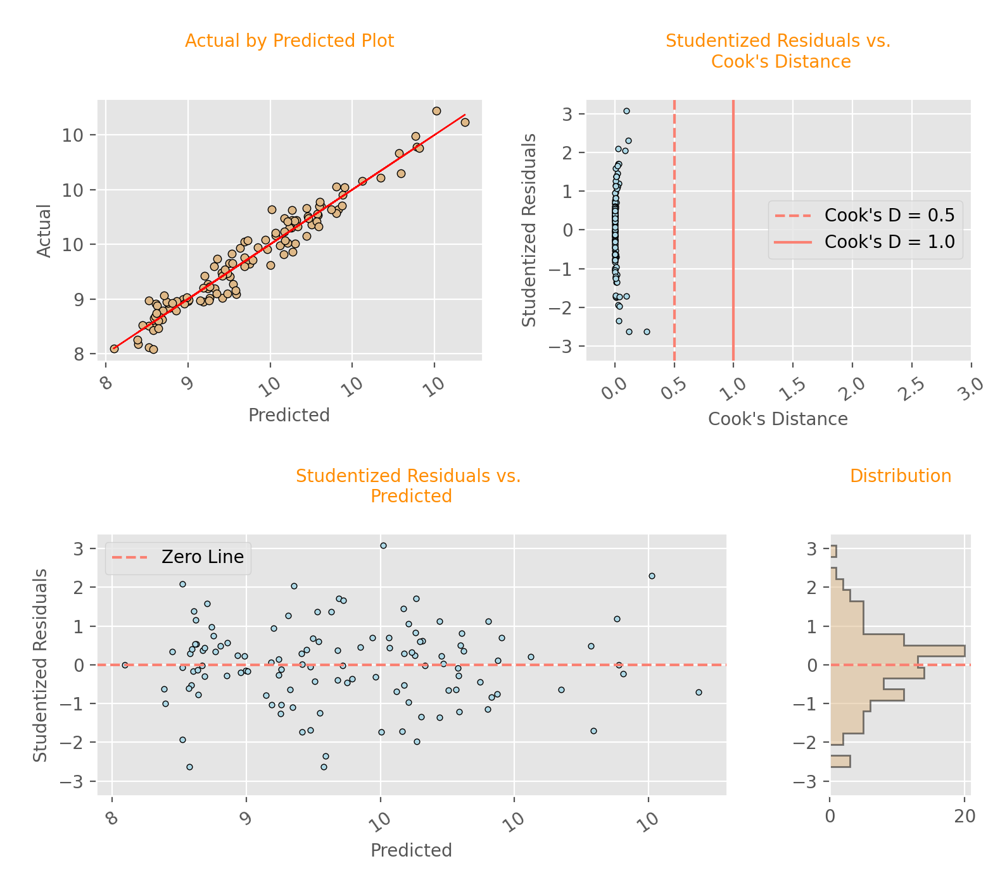

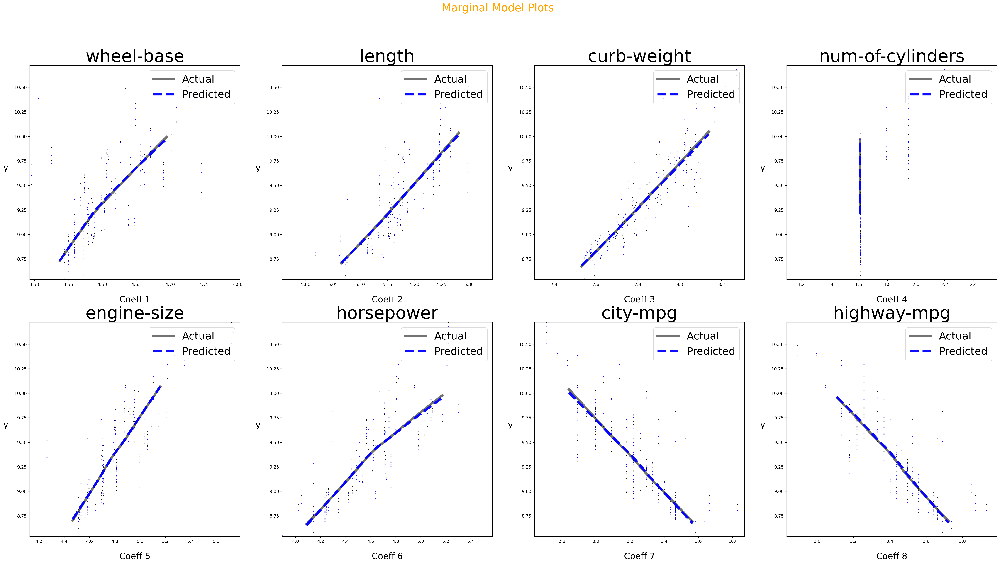

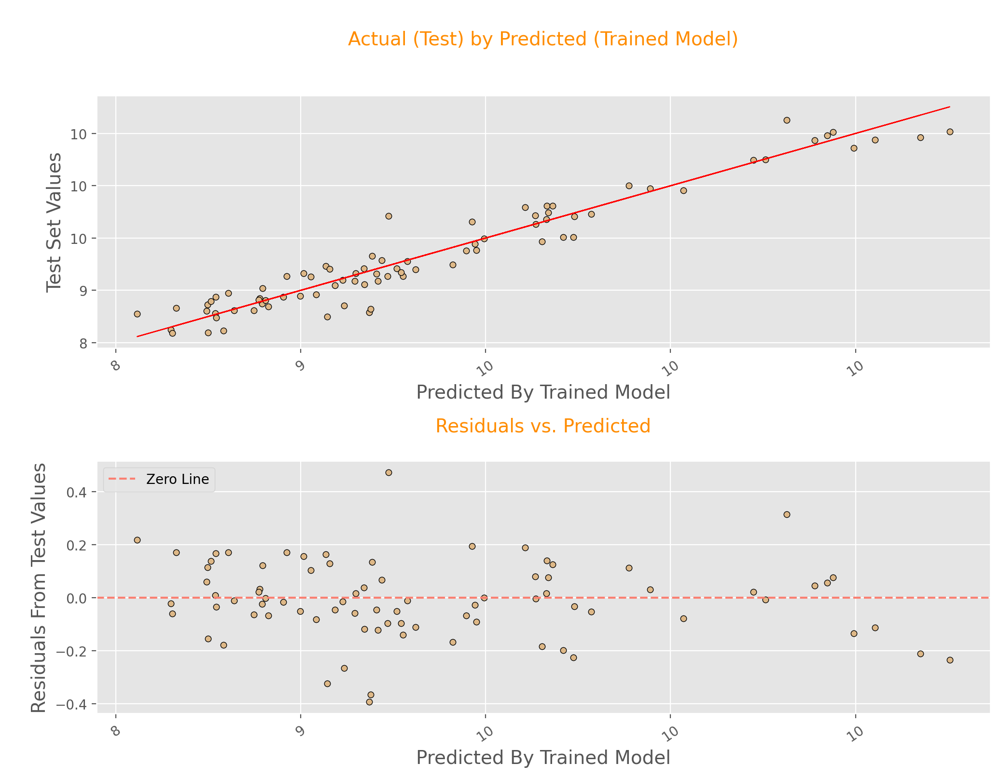

In [77]:
ridge_features_list = ridge_selector(X,y,test_size = 0.40, random_state = 42)

### Remove High VIF's

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=42)
vifs = get_vifs(X_train[ridge_features_list].copy(), add_intercept=True)
ridge_features_low_vifs=vifs.loc[vifs <10]
ridge_features_low_vifs=pd.DataFrame(ridge_features_low_vifs)
ridge_features_low_vifs

,VIF
wheel-base,7.705358
num-of-cylinders,4.876498
make-_audi,1.575129
make-_bmw,1.304965
make-_chevrolet,1.278604
make-_dodge,1.274918
make-_mercedes-benz,1.982739
make-_peugot,2.005401
make-_plymouth,1.213579
make-_saab,1.641453



All Possible Models

Total columns/features:          15
Max coefficients to use:         15
Min coefficients to use:         0
Total number of models to fit:   32767
Number of combinations:          32767
Number of top models to display: 10

****Fitting 32767 model(s) out of 32767 possible combinations?****



,coeffs,num_terms,aic,aicc,bic,rsquared_adj,rmse
6036,"[const, wheel-base, bmw, mercedes-benz, toyota, mpfi]",5,47.0816,47.8249,63.8065,0.634179,0.0392157
4686,"[const, wheel-base, bmw, mercedes-benz, toyota, convertible, mpfi]",6,44.9174,45.9174,64.4298,0.643528,0.0378782
6758,"[const, wheel-base, mercedes-benz, toyota, mpfi]",4,50.7096,51.236,64.6471,0.619946,0.0410988
4691,"[const, wheel-base, bmw, mercedes-benz, subaru, toyota, mpfi]",6,45.2032,46.2032,64.7156,0.642679,0.0379685
5867,"[const, wheel-base, mercedes-benz, toyota, wagon, mpfi]",5,48.2704,49.0138,64.9954,0.630536,0.0396062
4685,"[const, wheel-base, bmw, mercedes-benz, toyota, wagon, mpfi]",6,45.5792,46.5792,65.0916,0.641557,0.0380877
5873,"[const, wheel-base, mercedes-benz, subaru, toyota, mpfi]",5,48.6684,49.4118,65.3934,0.629309,0.0397377
4755,"[const, wheel-base, bmw, dodge, mercedes-benz, toyota, mpfi]",6,45.9609,46.9609,65.4734,0.640415,0.038209
3119,"[const, wheel-base, bmw, dodge, mercedes-benz, subaru, toyota, mpfi]",7,43.2218,44.5191,65.5217,0.651253,0.0367295
3050,"[const, wheel-base, bmw, mercedes-benz, toyota, convertible, wagon, mpfi]",7,43.3086,44.6059,65.6085,0.651001,0.036756



Best Model Fit Based on BIC


Columns Used:

wheel-base
bmw
mercedes-benz
toyota
mpfi





,,
0,RSquare,0.649549
1,RSquare Adj,0.634179
2,Root Mean Square Error,0.039216
3,AIC,47.081553
4,BIC,63.806504
5,Mean of Response,9.35841
6,Observations (or Sum Wgts),120


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,5,17.445,17.445,42.2591
1,Error,114,9.462,9.462,Prob > F
2,C.Total,119,26.894,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,-4.61995,2.43522,-1.9,0.0603,-6.26773,-2.97216,.
1,wheel-base,2.99506,0.53133,5.64,<.0001*,2.63554,3.35459,2.1641*
2,bmw,0.50598,0.21626,2.34,0.021*,0.35965,0.65231,1.0851*
3,mercedes-benz,0.90445,0.26571,3.4,0.0009*,0.72466,1.08424,1.0385*
4,toyota,-0.27771,0.10244,-2.71,0.0077*,-0.34703,-0.2084,1.2141*
5,mpfi,0.59237,0.08302,7.14,<.0001*,0.5362,0.64855,2.0048*


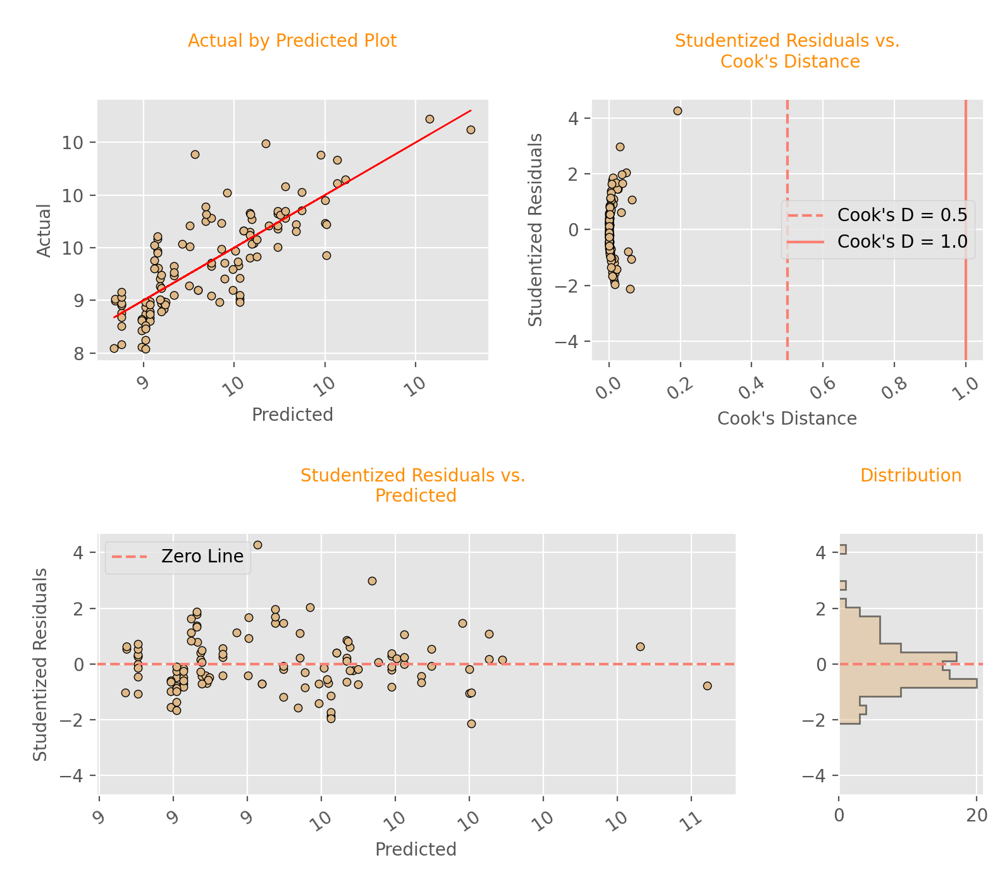

In [39]:
df, ridge_fitted_model = all_possible_models(
    y_train,
    X_train[ridge_features_low_vifs.index.to_list()],
    w=False,
    num_show = 10,
    min_cols = 1,
    max_cols = len(X.columns),
    stopping_rule = 'bic',
    dislay_results = True,
    pval_max = 0.5,
    vif_max = 10,
    add_intercept=True,
    screen_pvalues=True,
    screen_vifs=True
 )

### LASSO Cross Validation and Feature Selection


---TRAIN SET-----




,,
0,RSquare,0.952982
1,RSquare Adj,0.940478
2,Root Mean Square Error,0.005261
3,AIC,-153.962185
4,BIC,-81.4874
5,Mean of Response,9.35841
6,Observations (or Sum Wgts),120


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,25,25.6,25.6,76.21
1,Error,94,1.222,1.222,Prob > F
2,C.Total,119,26.894,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,0.51758,1.71522,0.3,0.7635,-0.6438,1.67897,.
1,curb-weight,1.27805,0.24953,5.12,<.0001*,1.10909,1.44701,20.4191
2,num-of-cylinders,0.12519,0.13205,0.95,0.3455,0.03578,0.2146,4.8355*
3,engine-size,0.03154,0.1571,0.2,0.8413,-0.07484,0.13792,17.1641
4,compression-ratio,0.13601,0.07332,1.86,0.0667,0.08637,0.18565,3.1664*
5,horsepower,-0.0262,0.15042,-0.17,0.8621,-0.12805,0.07565,22.0845
6,city-mpg,-0.47515,0.18746,-2.53,0.0129*,-0.60208,-0.34822,17.708
7,make-_audi,0.25526,0.08995,2.84,0.0056*,0.19435,0.31616,1.3866*
8,make-_bmw,0.44423,0.09795,4.54,<.0001*,0.37791,0.51055,1.3268*
9,make-_chevrolet,0.44727,0.18594,2.41,0.0181*,0.32137,0.57317,1.2263*


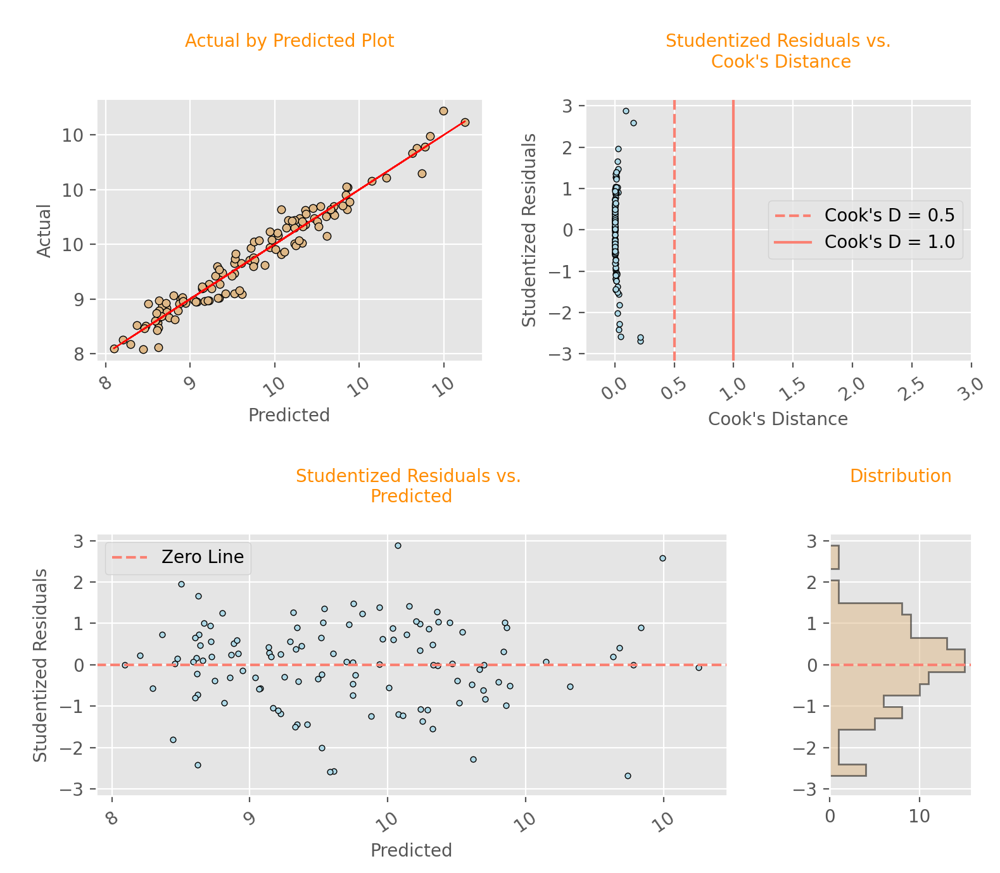

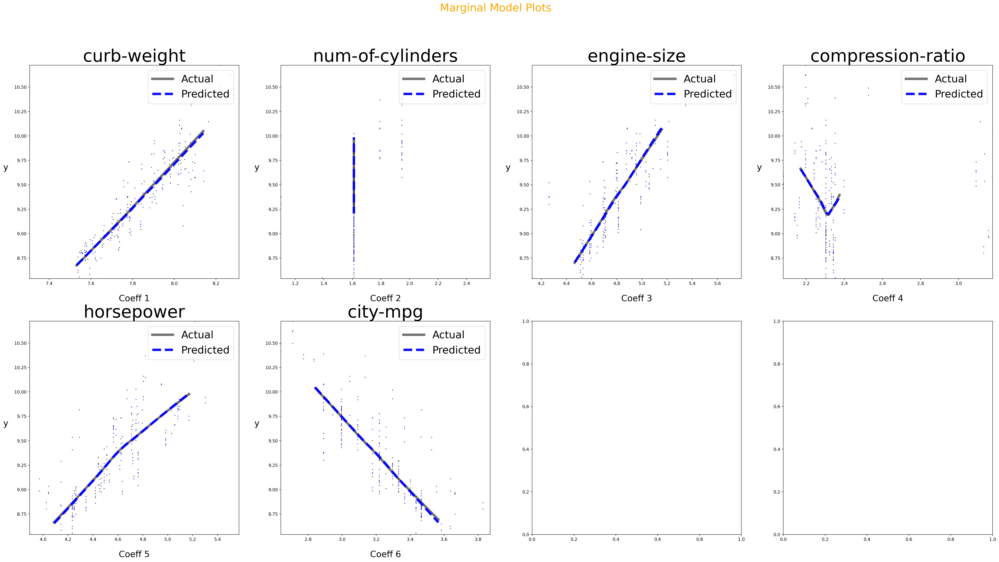

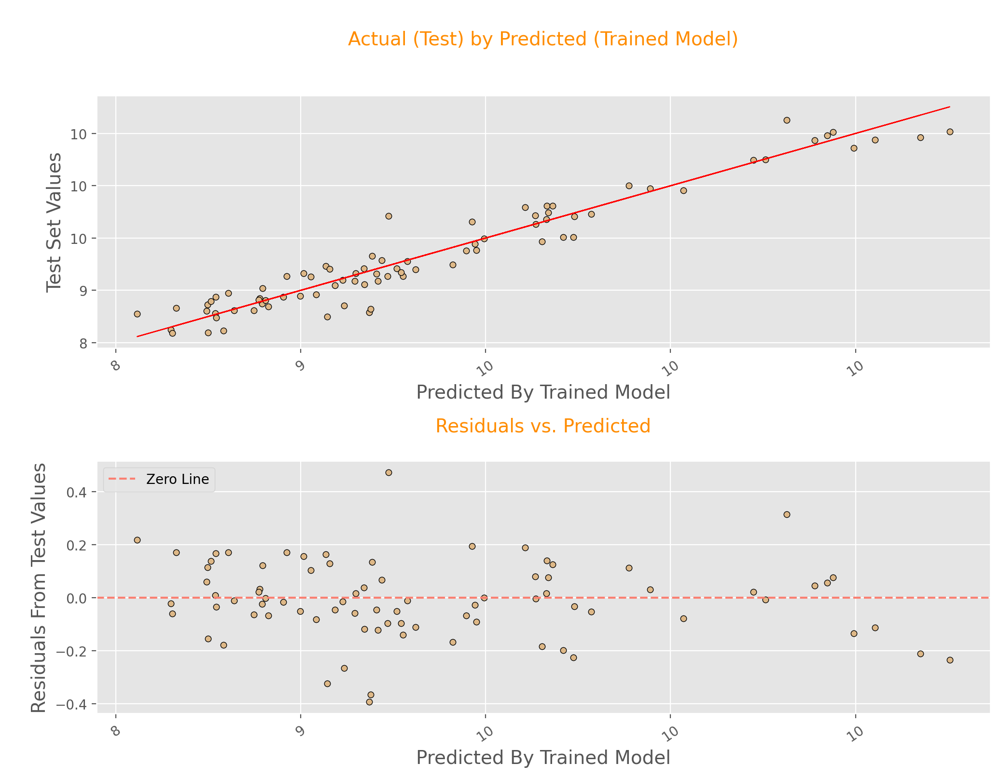

In [79]:
lasso_features_list = lasso_selector(X,y,test_size = 0.40, random_state = 42)

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=42)
vifs = get_vifs(X_train[lasso_features_list].copy(), add_intercept=True)
lasso_features_low_vifs=vifs.loc[vifs <10]
lasso_features_low_vifs=pd.DataFrame(lasso_features_low_vifs)
lasso_features_low_vifs     

,VIF
num-of-cylinders,4.835544
compression-ratio,3.166378
audi,1.386628
bmw,1.326774
chevrolet,1.226298
dodge,1.357677
mazda,1.786638
mercedes-benz,1.619754
mitsubishi,1.612706
peugot,1.910866


In [42]:
# df, lasoo_fitted_model = all_possible_models(
#     y_train,
#     X_train[lasso_features_low_vifs.index.to_list()],
#     w=False,
#     num_show = 10,
#     min_cols = 1,
#     max_cols = len(X.columns),
#     stopping_rule = 'bic',
#     dislay_results = Truel,
#     pval_max = 0.5,
#     vif_max = 10,
#     add_intercept=True,
#     screen_pvalues=True,
#     screen_vifs=True
#  )

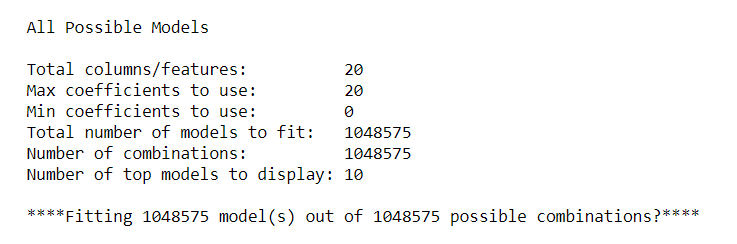

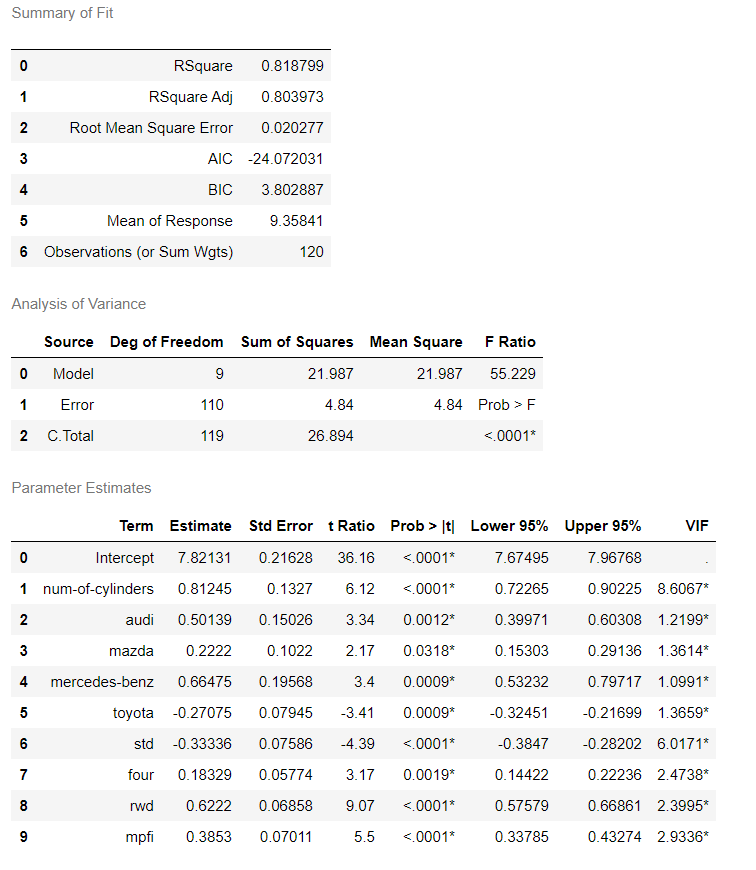


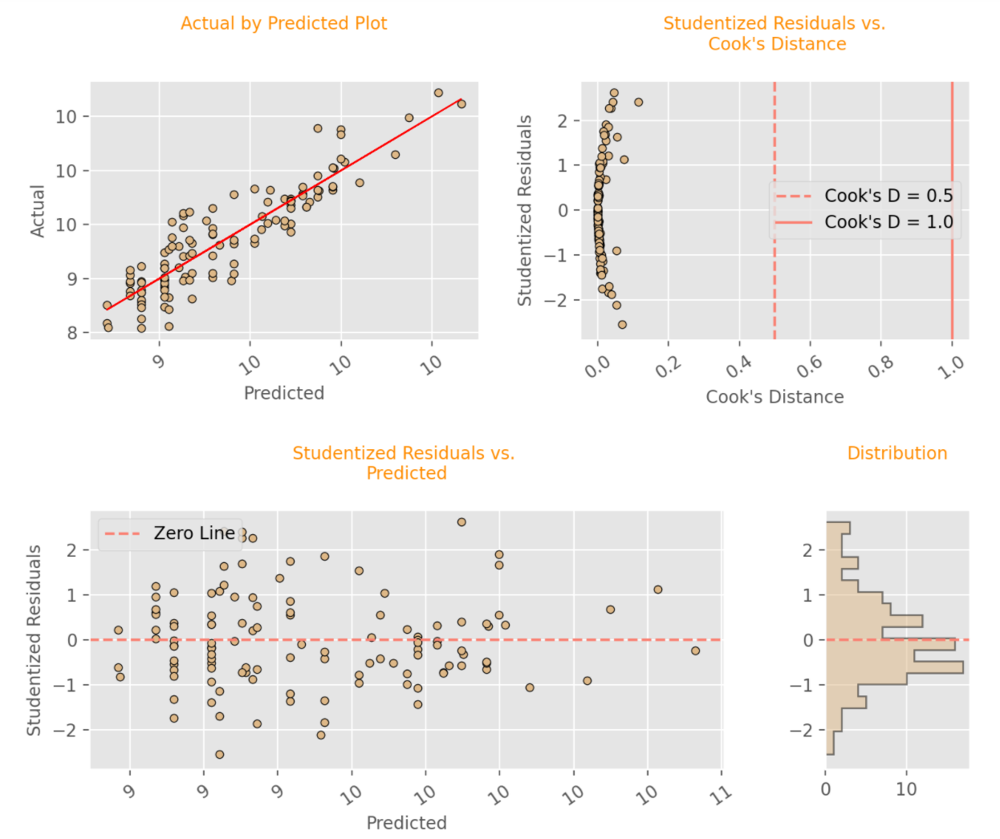

### Elastic Net Cross Validation and Feature Selection


---TRAIN SET-----




,,
0,RSquare,0.946263
1,RSquare Adj,0.936686
2,Root Mean Square Error,0.006013
3,AIC,-151.931594
4,BIC,-98.969251
5,Mean of Response,9.35841
6,Observations (or Sum Wgts),120


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,18,25.416,25.416,98.806
1,Error,101,1.414,1.414,Prob > F
2,C.Total,119,26.894,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,-1.55877,1.29314,-1.21,0.2309,-2.43413,-0.6834,.
1,curb-weight,1.56335,0.21407,7.3,<.0001*,1.41844,1.70826,14.1277
2,engine-size,-0.0258,0.10378,-0.25,0.8041,-0.09606,0.04445,7.0411*
3,compression-ratio,0.18933,0.07274,2.6,0.0106*,0.14009,0.23857,2.9299*
4,horsepower,0.03607,0.11815,0.31,0.7608,-0.04391,0.11605,12.8095
5,city-mpg,-0.35662,0.16628,-2.14,0.0344*,-0.46918,-0.24406,13.0981
6,make-_audi,0.29365,0.09074,3.24,0.0016*,0.23223,0.35507,1.3265*
7,make-_bmw,0.48667,0.09705,5.01,<.0001*,0.42098,0.55237,1.2245*
8,make-_chevrolet,0.43825,0.189,2.32,0.0224*,0.31031,0.56619,1.1911*
9,make-_mercedes-benz,0.44018,0.12465,3.53,0.0006*,0.3558,0.52457,1.5282*


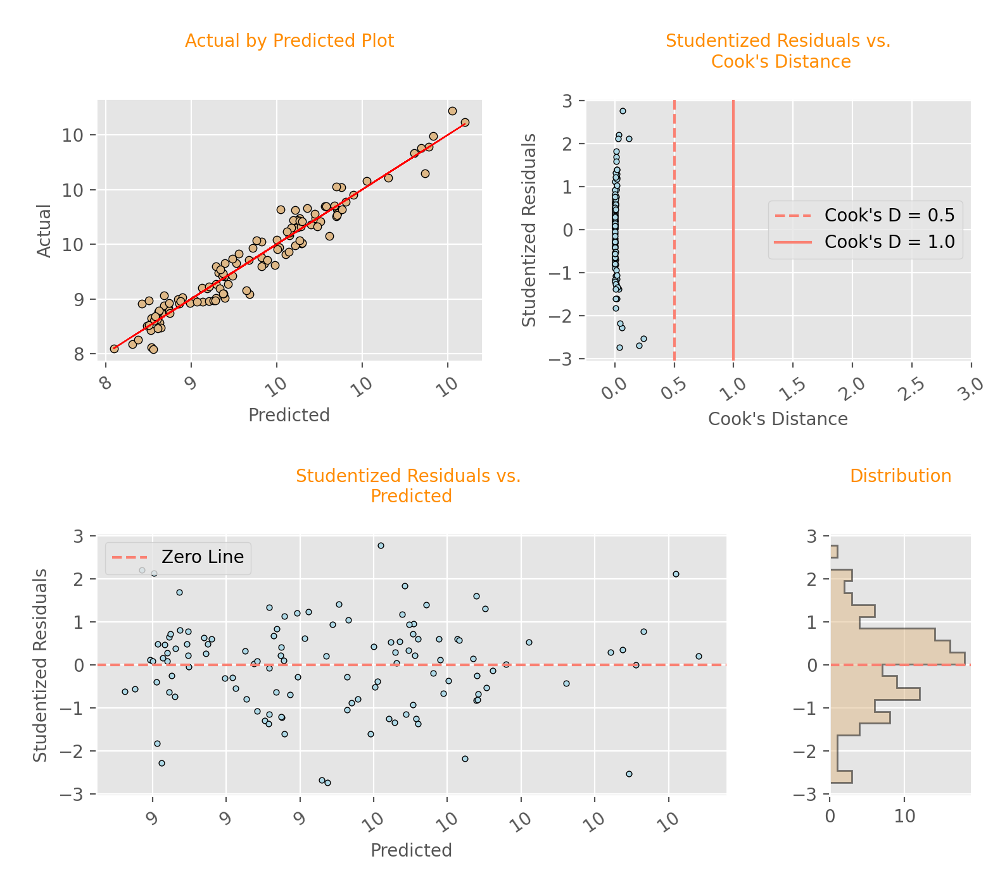

NameError: name 'results' is not defined

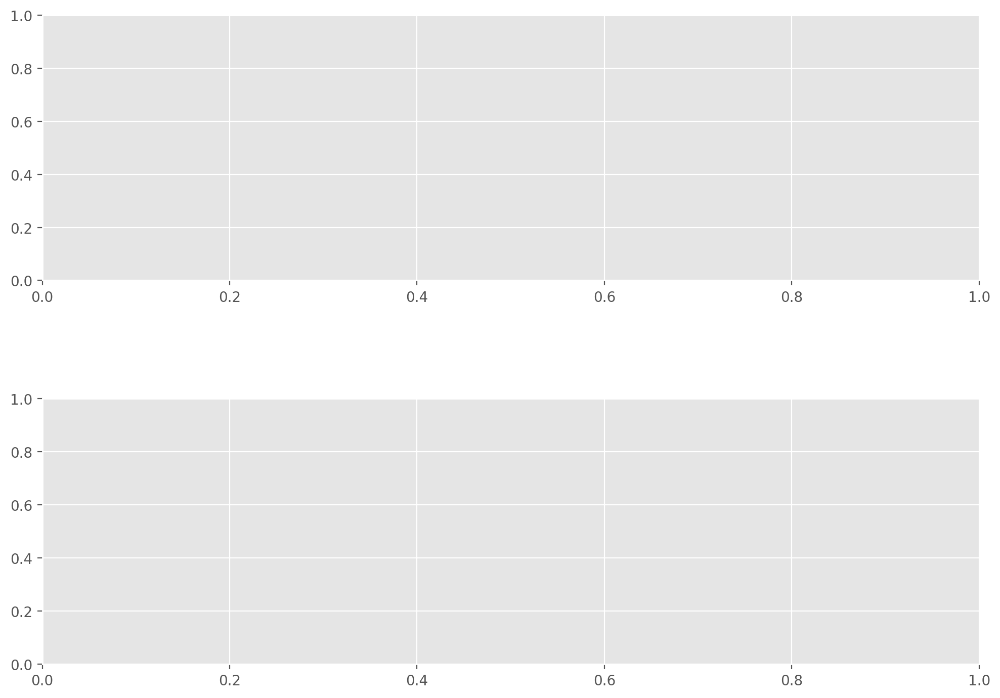

In [82]:
enet_features_list = enet_selector(X,y,test_size = 0.40, random_state = 42)

In [83]:
enet_features_list


NameError: name 'enet_features_list' is not defined